In [2]:
import pandas as pd
import numpy as np
import re
import itertools

%matplotlib inline
import torch
import networkx as nx
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from elasticsearch import Elasticsearch
from elasticsearch.helpers import scan, bulk
from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor

from utils.parquet import Parquet
import utils.helpers as hp
import urllib3
urllib3.disable_warnings()


def queryPSTrace(args):
    data = []
    dt, src, dest, throughput_Mb = args    
    def query(comp):
        return {
            "bool": {
                "must": [
                    {
                        "range": {
                            "timestamp": {
                                comp: int(dt.timestamp()*1000),
                            }
                        }
                    },
                    {
                      "term": {
                        "src": src
                      }
                    },
                    {
                      "term": {
                        "dest": dest
                      }
                    }
                ]
            }
        }
    # print(str(query).replace("\'", "\""))

    ### TODO: ADD A CHECK HERE: if the traceroute was older than 10m from the dt, discard the record!!!!

    # grab the 2 closest traceroutes
    result = hp.es.search(index='ps_trace', query=query('gte'), sort='timestamp:asc', size=1)
    for item in result['hits']['hits']:
        r = item['_source']
        item['throughput_Mb'] = throughput_Mb
        if len(r)>0:
            data.append(item['_source'])
            

    result = hp.es.search(index='ps_trace', query=query('lte'), sort='timestamp:desc', size=1)
    for item in result['hits']['hits']:
        r = item['_source']
        item['throughput_Mb'] = throughput_Mb
        if len(r)>0:
            data.append(item['_source'])
    
    return data


def split_list(lst, chunk_size):
    for i in range(0, len(lst), chunk_size):
        yield lst[i:i+chunk_size]


def startThreads(batch):
    with ThreadPoolExecutor(max_workers=1000) as pool:
        result = pool.map(queryPSTrace, batch)
    
    data = []
    for r in result:
        data.extend(r)
    return data

 
def getDf(dftype):
    pq = Parquet()
    dd = pq.readSequenceOfFiles('/data/petya/parquet/raw/', dftype)
    dd = dd.reset_index(drop=True)
    if dftype == 'ps_throughput':
        dd['throughput_Mb'] = round(dd['throughput']*1e-6)
    dd['dt'] = pd.to_datetime(dd['timestamp'], unit='ms')
    dd['src_site'] = dd['src_site'].str.upper()
    dd['dest_site'] = dd['dest_site'].str.upper()
    dd.head(2)
    return dd



def removeInvalid(tracedf):
    pattern = r'^((25[0-5]|(2[0-4]|1\d|[1-9]|)\d)\.?\b){4}$'
    tracedf['for_removal'] = 0
    i, j = 0, 0
    for idx, route, pair, hops, ipv, rm in tracedf[tracedf['ipv6']==True][['route-sha1', 'pair', 'hops', 'ipv6', 'for_removal']].itertuples():
        isIPv4 = None
        if len(hops) > 2:
            if ipv == True: 
                isIPv4 = re.search(pattern, hops[-1])

                if isIPv4:
                    # print(isIPv4, ipv)
                    tracedf.iat[idx, tracedf.columns.get_loc('for_removal')] = 1
                    i+=1
        else:
            tracedf.iat[idx, tracedf.columns.get_loc('for_removal')] = 1
            j+=1


    nullsite = len(tracedf[(tracedf['src_site'].isnull()) | (tracedf['dest_site'].isnull())])

    print(f'{round(((i+j+nullsite)/len(tracedf))*100,0)}% invalid entries removed.')

    tracedf = tracedf[~((tracedf['src_site'].isnull()) | (tracedf['dest_site'].isnull()))]
    tracedf = tracedf[tracedf['for_removal']==0]
    
    return tracedf.drop(columns=['for_removal'])


Success


### Get the tracerotes around throughput tests

Store the data in a file.

In [ ]:
trptdf = getDf('ps_throughput')
result = []
rows = trptdf[['dt', 'src', 'dest', 'throughput_Mb']].values.tolist()
value_list = split_list(rows,10000)
# this is not CPU bound. Use only threads!
with ProcessPoolExecutor(max_workers=32) as pool:
    print('Starting parallel processing....')
    result = pool.map(startThreads, value_list)


tracedata = []
for r in result:
    tracedata.extend(r)



print(f'Number of traceroutes loaded: {len(tracedata)}')

from utils.parquet import Parquet
tracedf = pd.DataFrame(tracedata)
tracedf = tracedf[['max_rtt', 'src_VO',
                   'created_at', 'dest', 'src_site',
                   'path_complete', 'MA',
                   'destination_reached', 'ipv6', 
                   'dest_production', 'asns', 'n_hops',
                   'timestamp', 'src', 'dest_site', 
                   'dest_VO', 'looping', 'src_host',
                   'route-sha1', 'ttls', 'rtts', 
                   'dest_host', 'hops', 'src_production']]
location = '/data/petya/parquet/raw/'

pq = Parquet()
pq.writeToFile(tracedf, f'{location}tracedf')

Starting parallel processing....


#### Save time and load the data from a file. Add some useful columns. 

In [3]:
trptdf = getDf('ps_throughput')
tracedf = getDf('tracedf')


print(trptdf.dt.min(), trptdf.dt.max())

trptdf['pair'] = trptdf['src']+'-'+trptdf['dest']
tracedf['pair'] = tracedf['src']+'-'+tracedf['dest']
tracedf['site_pair'] = tracedf['src_site']+' -> '+tracedf['dest_site']
trptdf['site_pair'] = trptdf['src_site']+' -> '+trptdf['dest_site']

tracedf = tracedf[~tracedf['hops'].isnull()]
tracedf = removeInvalid(tracedf.reset_index())


pairs = trptdf['pair'].unique().tolist()
print(f'traceroute only: {len(set(tracedf["pair"].unique().tolist()) - set(pairs))} pairs')
print(f'at least one other test: {len(set(pairs))} pairs')

hops = sorted(list(set(itertools.chain(*tracedf['hops'].values.tolist()))))
print("Number of nodes:",len(set(hops)))

# give ids to IPs
hopsmap = {ip:i for i, ip in enumerate(hops)}
hopsmap_r = {ip:label for label, ip in hopsmap.items()}

2023-01-01 00:15:17 2023-05-01 00:14:55
20.0% invalid entries removed.
traceroute only: 0 pairs
at least one other test: 6751 pairs
Number of nodes: 5577


#### Check the number of unique paths between source an destination

,route
count,2612.000000
mean,18.471286
std,49.611277
min,1.000000
25%,2.000000
50%,5.000000
75%,13.000000
max,689.000000


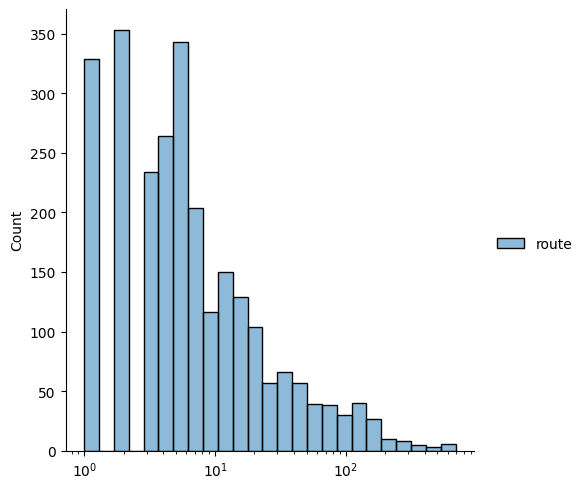

In [9]:
import seaborn as sns
routes = tracedf.groupby(['pair'])['route'].nunique().to_frame().reset_index()
display(routes.describe())

sns.displot(routes, log_scale=True)


#### Choose a protocol (ipv6/ipv4)
There's no mapping between the two and paths differ signifficantly in some cases

In [4]:
ipv6 = True
trptdf = trptdf[trptdf['ipv6']==ipv6].sort_values(['src_site', 'dest_site'])
tracedf = tracedf[tracedf['ipv6']==ipv6]
tracedf.rename(columns={'route-sha1':'route'}, inplace=True)

trptdf = trptdf.sort_values('dt')
tracedf = tracedf.sort_values('dt')
print(f"Range of data {tracedf.dt.min()} - {tracedf.dt.max()}")

# t1 = 'CERN CERN-PROD TRIUMF-LCG2 FZK-LCG2 pic PIC IN2P3-CC INFN-T1 KR-KISTI-GSDC-01 NDGF-T1 NIKHEF-ELPROD SARA-MATRIX RRC-KI-T1 JINR-T1 Taiwan-LCG2 RAL-LCG2 USCMS-FNAL-WC1 BNL-ATLAS'.split(' ')
# tracedf['t1'] = 0
# tracedf.loc[tracedf.src_site.isin(t1) | tracedf.dest_site.isin(t1), 't1'] = 1

Range of data 2021-04-28 15:20:12 - 2023-05-01 00:20:25


#### Routers get RTT values

In [ ]:
rttlist = []

for dt, pair, hops, route, ttls, rtts, sites in tracedf[['dt', 'pair', 'hops','route', 'ttls', 'rtts','site_pair']].values:
    path = hops.tolist().copy()
    rtt = rtts.tolist().copy()
    for i in range(0, len(rtt)-1):
        rttlist.append({'node': path[i], 'rtt': rtt[i],
                           'dt': dt, 'pos': i,
                           'pair': pair, 'route': route, 'site_pair': sites})

rttdf = pd.DataFrame(rttlist)
rttdf.head()

#### Routers get throughput values
Loop over all tracroute tests and extract the routers. Then assign throughput values just before and just after the end of the throughput test

In [6]:
from multiprocessing import current_process

def nodeThrpt(batch):    
    tplist, pathTp = [], []
    for pair, dt, thp, sites in batch:
        cuttrace = tracedf[tracedf['pair']==pair].copy()
        cuttrace.set_index('dt', inplace=True)
        cuttrace.index = pd.to_datetime(cuttrace.index, unit='s')

        if len(cuttrace)>0:
            # find the colsest 2 traceroutes to the time the throuput test run
            closest = sorted(cuttrace.index.values, key=lambda sub: abs(sub - dt))[:2]

            for trace_dt, vals in cuttrace[cuttrace.index.isin(closest)][['hops','route']].iterrows():
                hops = vals['hops']
                route = vals['route']
                pathTp.append({'dt': dt, 'val': thp, 'pair': pair, 'route': route, 'site_pair': sites, 'trace_dt': trace_dt})
                for h in hops:
                    tplist.append({'node': h, 'dt': dt, 'val': thp, 'pair': pair, 'route': route, 'site_pair': sites, 'trace_dt': trace_dt})

    return tplist, pathTp


value_list = list(split_list(trptdf[['pair', 'dt', 'throughput_Mb', 'site_pair']].drop_duplicates().values.tolist(),5000))
result = []
with ProcessPoolExecutor(max_workers=32) as pool:
    print('Starting parallel processing....')
    result = list(pool.map(nodeThrpt, value_list))


tplist, pathTp = [],[]
for vlist in result:
    tplist.extend(vlist[0])
    pathTp.extend(vlist[1])
        
nodeDf = pd.DataFrame(tplist).drop_duplicates()
pathDf = pd.DataFrame(pathTp).drop_duplicates()
pathDf = pd.merge(pathDf, tracedf[['site_pair','src_site', 'dest_site']].drop_duplicates(), left_on='site_pair', right_on='site_pair')

pq = Parquet()
location = '/data/petya/parquet/raw/'
pq.writeToFile(nodeDf, f'{location}nodeDf')
pq.writeToFile(pathDf, f'{location}pathDf')

Starting parallel processing....


#### Get the data from a file

In [5]:
pq = Parquet()
location = '/data/petya/parquet/raw/'
nodeDf = pq.readSingleFile(f'{location}nodeDf')
pathDf = pq.readSingleFile(f'{location}pathDf')

#### Get some statistics for each router

In [6]:
import statistics

statsthrp, statsthrp1 = [],[]
    
grouped = nodeDf.groupby('node')
for k, group in grouped:
    vals = group.val
    if len(vals)>2:
        minv = min(vals)
        avgv = round(sum(vals)/len(vals))
        maxv = max(vals)
        modev = statistics.mode(vals)
        stdv = round(statistics.stdev(vals))
        varv = round(statistics.variance(vals),3)
        statsthrp.append({'node':k, 'min': minv, 'avg': avgv, 'max': maxv, 'mode': modev, 'std': stdv,'variance':varv, 'observations':len(vals)})
        statsthrp1.append({'node':k, 'type':'min', 'val': minv})
        statsthrp1.append({'node':k, 'type':'avg', 'val': avgv})
        statsthrp1.append({'node':k, 'type':'max', 'val': maxv})
        statsthrp1.append({'node':k, 'type':'mode', 'val': modev})


nodestatsdf = pd.DataFrame(statsthrp)
nodestatsdf1 = pd.DataFrame(statsthrp1)

pq.writeToFile(nodestatsdf, f'{location}nodestatsdf')
pq.writeToFile(nodestatsdf1, f'{location}nodestatsdf1')

#### Check the stats

In [113]:
import plotly.graph_objects as go

fig = px.histogram(nodestatsdf, x="min", log_y=True,
                   color_discrete_sequence=['indianred'], 
                   title='Distribution of the minimum',
                  histnorm='probability')
fig.update_layout(template='plotly_white', height=299)
fig.show()
fig = px.histogram(nodestatsdf, x="avg", title='Distribution of the average',
                  histnorm='probability')
fig.update_layout(template='plotly_white', height=299)
fig.show()
fig = px.histogram(nodestatsdf, x="max", color_discrete_sequence=['mediumseagreen'],  nbins=10,
                   title='Distribution of the maximum', 
                  histnorm='probability')
fig.update_layout(template='plotly_white', height=299)
fig.show()
fig = px.histogram(nodestatsdf, x="mode", color_discrete_sequence=['gold'], log_y=True,
                   title='Distribution of the mode',
                  histnorm='probability')
fig.update_layout(template='plotly_white', height=299)
fig.show()

#### Look for persistent down trends 
Some hard limits are applied here in order to get the most severe cases

In [7]:
from datetime import datetime, timedelta

def ranges(nums):
    nums = sorted(set(nums))
    gaps = [[s, e] for s, e in zip(nums, nums[1:]) if s+1 < e]
    edges = iter(nums[:1] + sum(gaps, []) + nums[-1:])
    return list(zip(edges, edges))


haveissues, data = [], []
def findConsecutive(group):

    tvals = group.val.values
    route = group.route.values
    pair = group.pair.values.tolist()
    t = group.dt.values
    node = group.name

    if len(tvals)>3:
        # print(node, nodestatsdf[nodestatsdf['node']==node]['max'])
        # find the indices of the values bellow the threshold of 10% of the max
        # print(node)
        maxv =  nodestatsdf[nodestatsdf['node']==node]['max'].values[0]
        minv = min(vals)
        avgv = round(sum(vals)/len(vals))
        modev = statistics.mode(vals)
        stdv = round(statistics.stdev(vals))
        varv = round(statistics.variance(vals),3)
        
        value_threshold = round(maxv*0.1)
        # value_threshold = 50
        a_tenth_of_all = round(len(tvals)*0.05)
        downtrend_len = a_tenth_of_all if a_tenth_of_all>10 else 10
        min_num_pairs = len(set(pair))*0.9 if len(set(pair))*0.9 > 5 else 6
        min_num_paths = len(set(route))*0.9

        ids = [i for i,v in enumerate(tvals) if v<value_threshold]

        # get the consecutive number that suggest there's a downtrend
        cons = ranges(ids)
        # at least one group should contain a minimum of 3 concecutive low values
        # print(tvalsr for r in cons if ])
        if any([r for r in cons if r[1]-r[0]>downtrend_len]):
            upairs, uroutes = [], []
            for i in [r for r in cons if r[1]-r[0]>downtrend_len]:
                upairs.extend(pair[i[0]: i[1]])
                uroutes.extend(route[i[0]: i[1]])

                # down trend should be affecting 90% of all unique paths and pairs 
                if len(set(upairs)) >= min_num_pairs and len(set(uroutes)) > min_num_paths:
                    curr_vals = tvals[i[0]: i[1]]
                    haveissues.append({'node': node, 'tstart': str(t[i[0]]), 'tend': str(t[i[1]]), 'values_curr': curr_vals,
                                       'max': maxv, 'avg_global': avgv, 'avg_curr': round(sum(curr_vals)/len(curr_vals)), 'mode': modev, 
                                       'std': stdv,'variance':varv, 'observations_curr':len(curr_vals),
                                       'num_pairs': len(set(pair)), 'num_paths': len(set(route)),
                                       'value_threshold':value_threshold, 
                                       'min_num_pairs': min_num_pairs, 
                                       'downtrend_len': downtrend_len, 
                                       'min_num_paths': min_num_paths})


step = 5
print(f"Split the period in bins of {step} days and look for a downtrend")
totalDays = round((trptdf.dt.max() - trptdf.dt.min()).days)
period = sorted([str(trptdf.dt.max() - timedelta(days=d)) for d in range(step, totalDays+(step-1), step)])

for i in range(len(period)-1):
    oldNum = len(haveissues)
    nodeDf[(nodeDf['dt']>period[i]) & (nodeDf['dt']<period[i+1])].sort_values(['node','dt']).groupby('node').apply(findConsecutive)
    print(period[i], '-->', period[i+1], 'Number of routers where issues have been detected:', len(haveissues)-oldNum)

if len(haveissues)>0:
    nodeIssuesDf = pd.DataFrame.from_dict(haveissues)


Split the period in bins of 5 days and look for a downtrend
2023-01-01 00:12:13 --> 2023-01-06 00:12:13 Number of routers where issues have been detected: 23
2023-01-06 00:12:13 --> 2023-01-11 00:12:13 Number of routers where issues have been detected: 24
2023-01-11 00:12:13 --> 2023-01-16 00:12:13 Number of routers where issues have been detected: 29
2023-01-16 00:12:13 --> 2023-01-21 00:12:13 Number of routers where issues have been detected: 26
2023-01-21 00:12:13 --> 2023-01-26 00:12:13 Number of routers where issues have been detected: 29
2023-01-26 00:12:13 --> 2023-01-31 00:12:13 Number of routers where issues have been detected: 31
2023-01-31 00:12:13 --> 2023-02-05 00:12:13 Number of routers where issues have been detected: 31
2023-02-05 00:12:13 --> 2023-02-10 00:12:13 Number of routers where issues have been detected: 27
2023-02-10 00:12:13 --> 2023-02-15 00:12:13 Number of routers where issues have been detected: 28
2023-02-15 00:12:13 --> 2023-02-20 00:12:13 Number of rout

#### Check how often a site name appears on the two ends of the paths related to the routers which showed a down trend

In [64]:
def guessWho():
    site2nodes, node2sites = {},{}
    for node in nodeIssuesDf.node.unique():
        # guessWho(nodeDf[nodeDf['node']==node])
        sub = nodeDf[nodeDf['node']==node]
        cnts = {}
        for p in sub['site_pair'].unique():
            s,d = p.split(' -> ')
            if s in cnts:
                cnts[s] = cnts[s]+1
            else: cnts[s] = 1
            if d in cnts:
                cnts[d] = cnts[d]+1
            else: cnts[d] = 1
    
        possibly = {k:v for k,v in cnts.items() if v==max(cnts.values())}
        site = list(possibly.keys())[0]
        if site not in site2nodes.keys():
            site2nodes[site] = [node]
        else: site2nodes[site].append(node)
    
        node2sites[node] = possibly

    return site2nodes, node2sites

site2nodes, node2sites = guessWho()

#### Plot the results

Possible issues close to BNL-ATLAS, found on 12 links
Start: 2023-01-31 07:07:42 --- End: 2023-02-04 23:30:09  --- AVG throughput: 191 Mbp/s
Start: 2023-02-05 05:37:17 --- End: 2023-02-09 23:50:19  --- AVG throughput: 137 Mbp/s
Start: 2023-02-10 02:07:04 --- End: 2023-02-14 13:06:18  --- AVG throughput: 1 Mbp/s


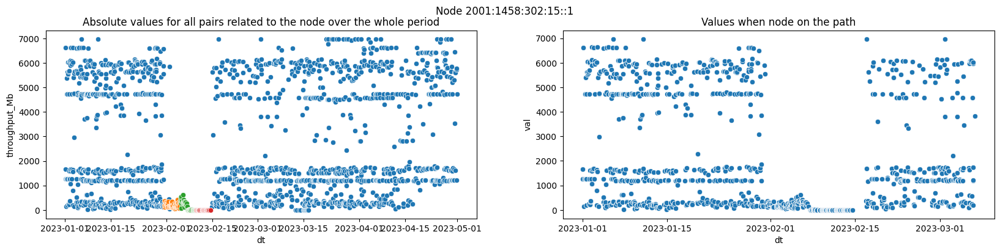

Possible issues close to RRC-KI-T1, found on 11 links
Start: 2023-02-28 20:14:55 --- End: 2023-03-01 09:08:29  --- AVG throughput: 417 Mbp/s
Start: 2023-03-31 14:48:59 --- End: 2023-03-31 23:09:01  --- AVG throughput: 532 Mbp/s
Start: 2023-04-04 20:42:48 --- End: 2023-04-05 09:55:52  --- AVG throughput: 532 Mbp/s
Start: 2023-04-17 11:41:03 --- End: 2023-04-18 01:27:27  --- AVG throughput: 651 Mbp/s


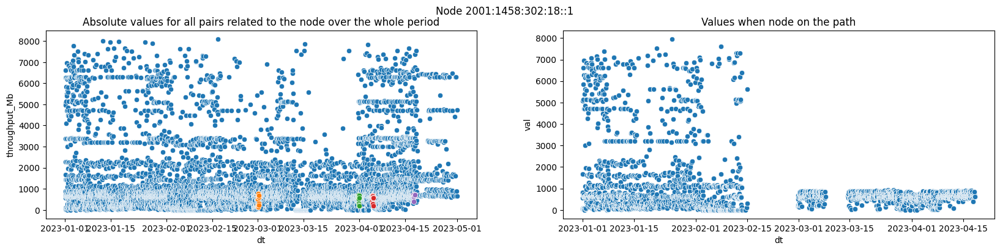

Possible issues close to NDGF-T1, found on 13 links
Start: 2023-02-28 16:17:56 --- End: 2023-03-01 23:40:33  --- AVG throughput: 490 Mbp/s
Start: 2023-03-02 00:27:34 --- End: 2023-03-07 00:10:17  --- AVG throughput: 468 Mbp/s
Start: 2023-03-07 00:47:14 --- End: 2023-03-08 06:40:51  --- AVG throughput: 435 Mbp/s
Start: 2023-03-14 09:07:03 --- End: 2023-03-16 23:19:09  --- AVG throughput: 453 Mbp/s
Start: 2023-03-17 01:20:57 --- End: 2023-03-21 21:12:01  --- AVG throughput: 452 Mbp/s
Start: 2023-03-22 00:31:37 --- End: 2023-03-26 23:45:33  --- AVG throughput: 472 Mbp/s
Start: 2023-03-27 01:19:07 --- End: 2023-03-31 23:34:02  --- AVG throughput: 461 Mbp/s
Start: 2023-04-01 01:36:09 --- End: 2023-04-05 23:16:46  --- AVG throughput: 460 Mbp/s
Start: 2023-04-06 00:25:18 --- End: 2023-04-10 23:55:09  --- AVG throughput: 473 Mbp/s
Start: 2023-04-11 00:30:06 --- End: 2023-04-15 23:04:09  --- AVG throughput: 491 Mbp/s
Start: 2023-04-16 01:31:03 --- End: 2023-04-18 14:59:18  --- AVG throughput: 5

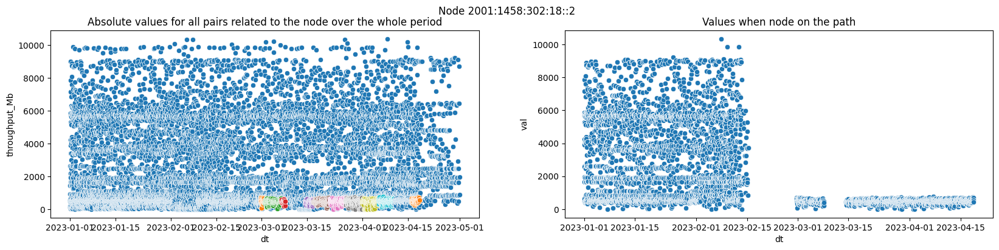

Possible issues close to TAIWAN-LCG2, found on 6 links
Start: 2023-03-12 14:05:23 --- End: 2023-03-16 21:46:27  --- AVG throughput: 0 Mbp/s


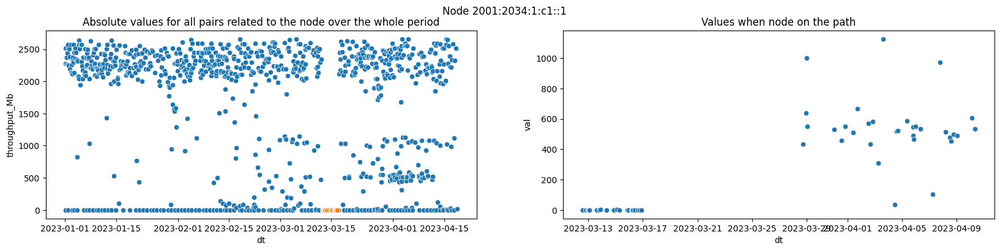

Possible issues close to BEIJING-LCG2, found on 15 links
Start: 2023-01-26 03:17:05 --- End: 2023-01-30 23:23:52  --- AVG throughput: 0 Mbp/s


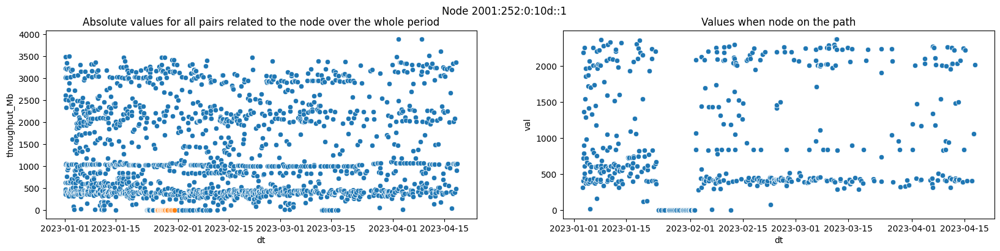

Possible issues close to BEIJING-LCG2, found on 12 links
Start: 2023-01-26 03:17:05 --- End: 2023-01-30 23:23:52  --- AVG throughput: 0 Mbp/s


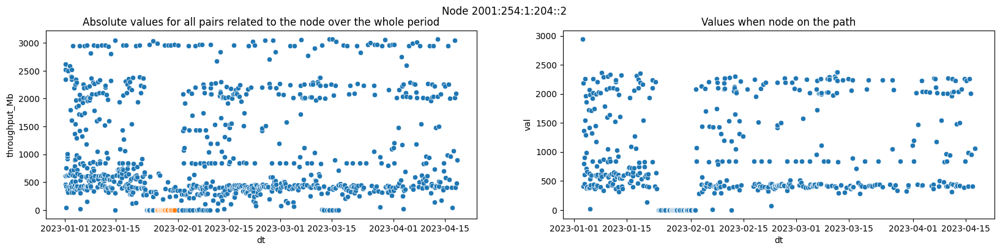

Possible issues close to VANDERBILT, found on 31 links
Start: 2023-01-21 00:38:47 --- End: 2023-01-25 22:29:45  --- AVG throughput: 16 Mbp/s
Start: 2023-01-26 00:33:54 --- End: 2023-01-30 22:42:45  --- AVG throughput: 14 Mbp/s


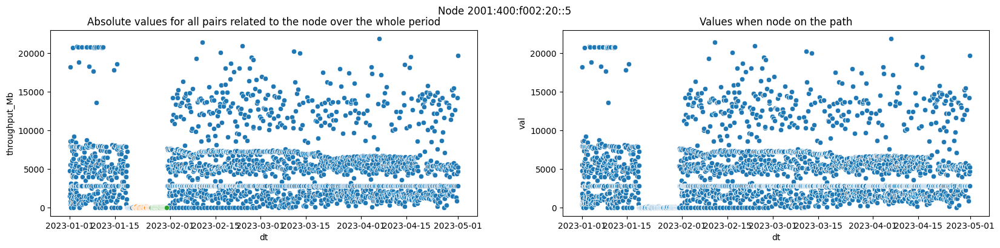

Possible issues close to VANDERBILT, found on 16 links
Start: 2023-01-21 00:38:47 --- End: 2023-01-25 22:29:45  --- AVG throughput: 22 Mbp/s
Start: 2023-01-26 00:33:54 --- End: 2023-01-30 22:42:45  --- AVG throughput: 21 Mbp/s


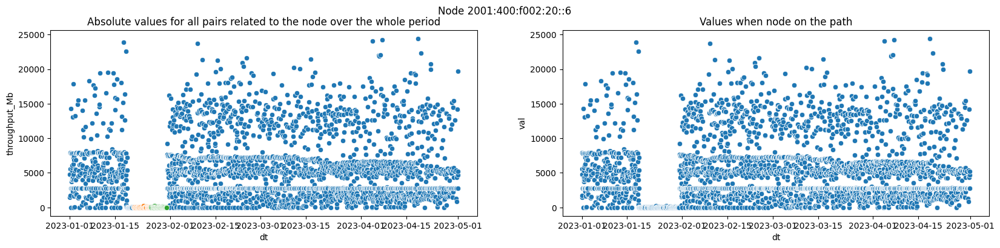

Possible issues close to BEIJING-LCG2, found on 10 links
Start: 2023-01-26 02:35:45 --- End: 2023-01-30 23:23:52  --- AVG throughput: 0 Mbp/s


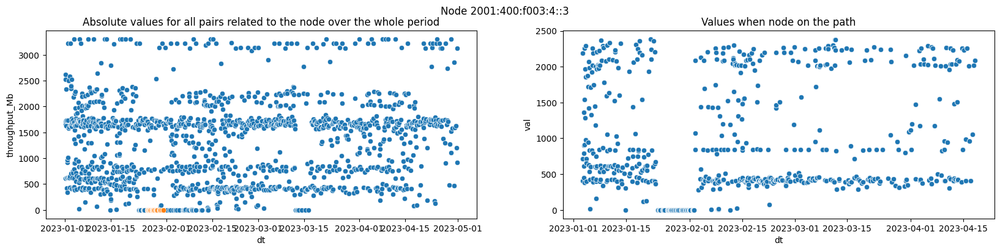

Possible issues close to PIC, found on 17 links
Start: 2023-01-14 17:53:47 --- End: 2023-01-15 22:41:17  --- AVG throughput: 173 Mbp/s


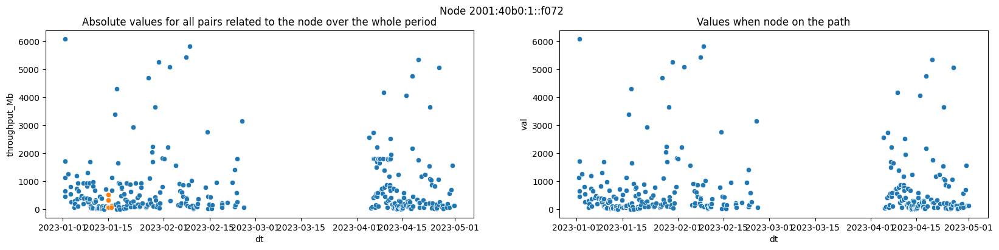

Possible issues close to AGLT2, found on 15 links
Start: 2023-02-03 21:10:45 --- End: 2023-02-04 12:33:31  --- AVG throughput: 130 Mbp/s


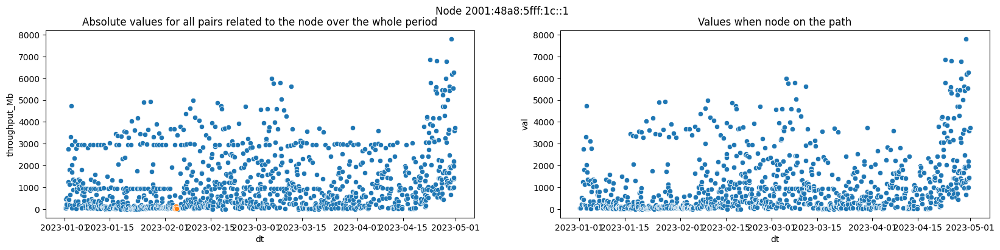

Possible issues close to AGLT2, found on 15 links
Start: 2023-02-03 21:10:45 --- End: 2023-02-04 12:33:31  --- AVG throughput: 137 Mbp/s


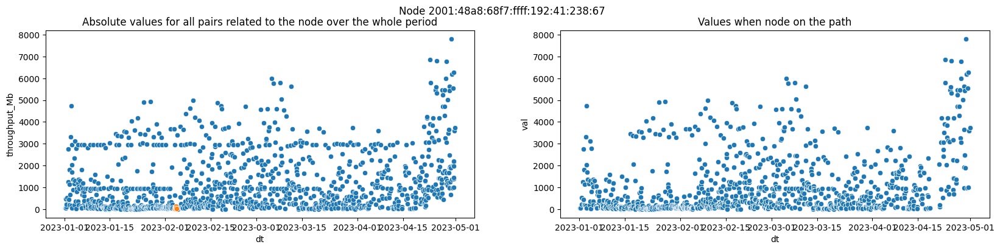

Possible issues close to UKI-NORTHGRID-LIV-HEP, found on 49 links
Start: 2023-01-15 03:41:50 --- End: 2023-01-15 22:39:22  --- AVG throughput: 635 Mbp/s
Start: 2023-01-16 00:28:24 --- End: 2023-01-20 19:22:05  --- AVG throughput: 514 Mbp/s
Start: 2023-01-24 02:53:16 --- End: 2023-01-25 03:00:25  --- AVG throughput: 529 Mbp/s
Start: 2023-01-30 05:42:23 --- End: 2023-01-30 22:12:10  --- AVG throughput: 633 Mbp/s
Start: 2023-02-02 15:49:02 --- End: 2023-02-04 23:11:48  --- AVG throughput: 656 Mbp/s
Start: 2023-02-05 02:21:41 --- End: 2023-02-09 02:39:29  --- AVG throughput: 602 Mbp/s
Start: 2023-02-09 06:48:03 --- End: 2023-02-09 22:41:28  --- AVG throughput: 484 Mbp/s
Start: 2023-02-10 02:51:10 --- End: 2023-02-14 22:50:45  --- AVG throughput: 604 Mbp/s
Start: 2023-03-13 12:14:36 --- End: 2023-03-16 12:08:52  --- AVG throughput: 861 Mbp/s
Start: 2023-04-10 15:39:25 --- End: 2023-04-10 23:39:34  --- AVG throughput: 1039 Mbp/s
Start: 2023-04-16 00:49:12 --- End: 2023-04-21 00:07:17  --- AV

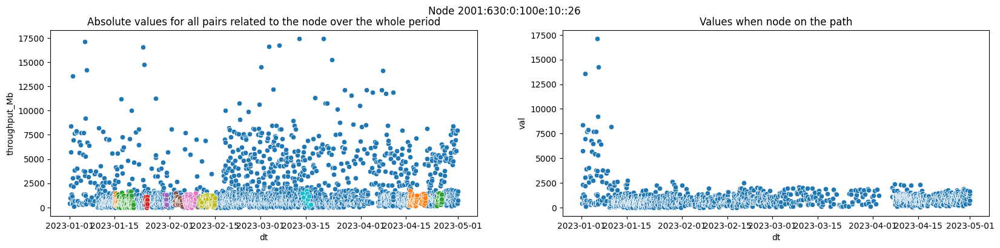

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 42 links
Start: 2023-01-04 05:14:51 --- End: 2023-01-05 23:16:29  --- AVG throughput: 240 Mbp/s
Start: 2023-01-07 07:24:24 --- End: 2023-01-10 23:50:20  --- AVG throughput: 211 Mbp/s
Start: 2023-01-16 01:17:44 --- End: 2023-01-20 23:33:45  --- AVG throughput: 234 Mbp/s
Start: 2023-01-24 06:07:29 --- End: 2023-01-25 22:55:33  --- AVG throughput: 255 Mbp/s
Start: 2023-01-30 05:43:26 --- End: 2023-01-30 23:03:45  --- AVG throughput: 236 Mbp/s
Start: 2023-02-04 02:12:10 --- End: 2023-02-04 23:26:22  --- AVG throughput: 218 Mbp/s
Start: 2023-02-13 13:35:22 --- End: 2023-02-14 22:39:58  --- AVG throughput: 209 Mbp/s


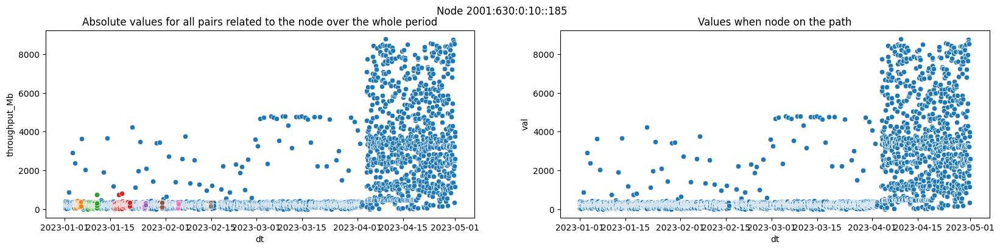

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 43 links
Start: 2023-01-01 03:08:10 --- End: 2023-01-05 22:45:33  --- AVG throughput: 192 Mbp/s
Start: 2023-01-06 02:48:55 --- End: 2023-01-10 23:06:21  --- AVG throughput: 176 Mbp/s
Start: 2023-01-11 01:26:53 --- End: 2023-01-15 22:10:20  --- AVG throughput: 196 Mbp/s
Start: 2023-01-16 01:45:40 --- End: 2023-01-20 20:09:13  --- AVG throughput: 179 Mbp/s
Start: 2023-01-21 01:16:20 --- End: 2023-01-25 21:57:53  --- AVG throughput: 164 Mbp/s
Start: 2023-01-26 02:31:59 --- End: 2023-01-30 23:27:13  --- AVG throughput: 200 Mbp/s
Start: 2023-01-31 02:08:32 --- End: 2023-02-04 23:58:41  --- AVG throughput: 179 Mbp/s
Start: 2023-02-05 01:19:12 --- End: 2023-02-09 22:36:57  --- AVG throughput: 163 Mbp/s
Start: 2023-02-10 01:26:12 --- End: 2023-02-14 19:39:01  --- AVG throughput: 182 Mbp/s
Start: 2023-02-15 03:09:43 --- End: 2023-02-19 23:41:40  --- AVG throughput: 188 Mbp/s
Start: 2023-02-20 01:32:17 --- End: 2023-02-24 23:54:14  --- AVG 

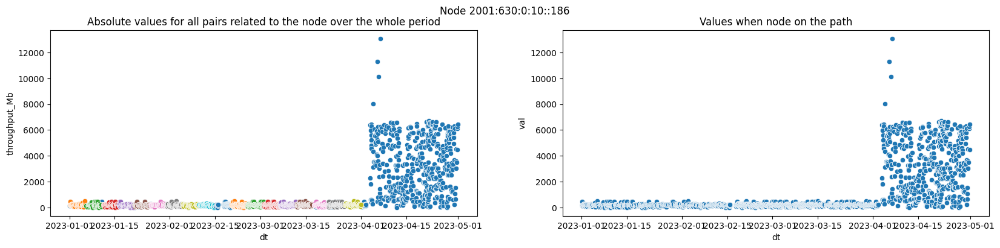

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 41 links
Start: 2023-01-10 08:01:17 --- End: 2023-01-10 23:50:20  --- AVG throughput: 235 Mbp/s
Start: 2023-01-17 10:32:08 --- End: 2023-01-20 23:33:45  --- AVG throughput: 249 Mbp/s
Start: 2023-01-25 04:57:19 --- End: 2023-01-25 22:55:33  --- AVG throughput: 259 Mbp/s


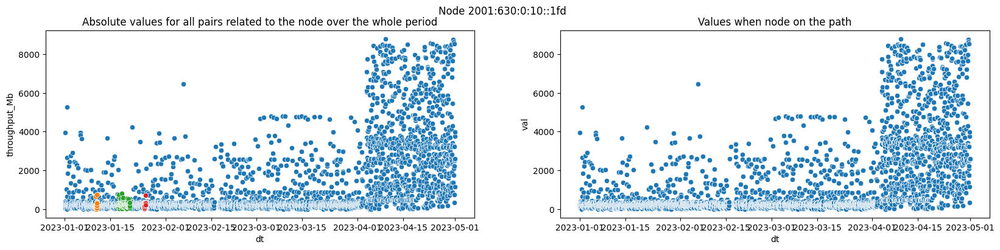

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 42 links
Start: 2023-01-01 03:08:10 --- End: 2023-01-05 22:45:33  --- AVG throughput: 193 Mbp/s
Start: 2023-01-06 02:48:55 --- End: 2023-01-10 23:06:21  --- AVG throughput: 176 Mbp/s
Start: 2023-01-11 01:26:53 --- End: 2023-01-15 22:10:20  --- AVG throughput: 196 Mbp/s
Start: 2023-01-16 01:45:40 --- End: 2023-01-20 20:09:13  --- AVG throughput: 185 Mbp/s
Start: 2023-01-21 01:16:20 --- End: 2023-01-25 21:57:53  --- AVG throughput: 157 Mbp/s
Start: 2023-01-26 02:31:59 --- End: 2023-01-30 23:27:13  --- AVG throughput: 199 Mbp/s
Start: 2023-01-31 02:08:32 --- End: 2023-02-04 23:58:41  --- AVG throughput: 178 Mbp/s
Start: 2023-02-05 01:19:12 --- End: 2023-02-09 22:36:57  --- AVG throughput: 166 Mbp/s
Start: 2023-02-10 01:26:12 --- End: 2023-02-14 19:39:01  --- AVG throughput: 186 Mbp/s
Start: 2023-02-15 03:09:43 --- End: 2023-02-19 23:41:40  --- AVG throughput: 188 Mbp/s
Start: 2023-02-20 01:32:17 --- End: 2023-02-24 23:54:14  --- AVG 

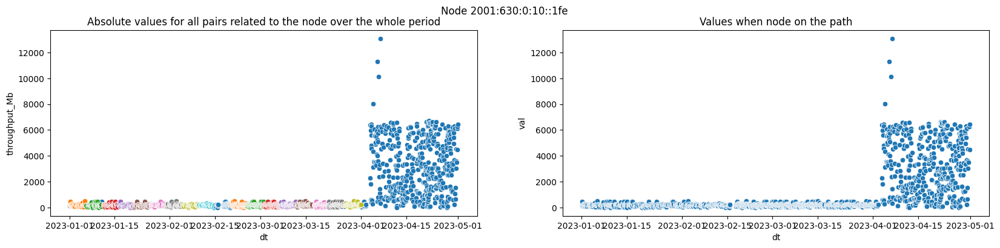

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 13 links
Start: 2023-02-18 00:56:13 --- End: 2023-02-19 18:13:17  --- AVG throughput: 185 Mbp/s


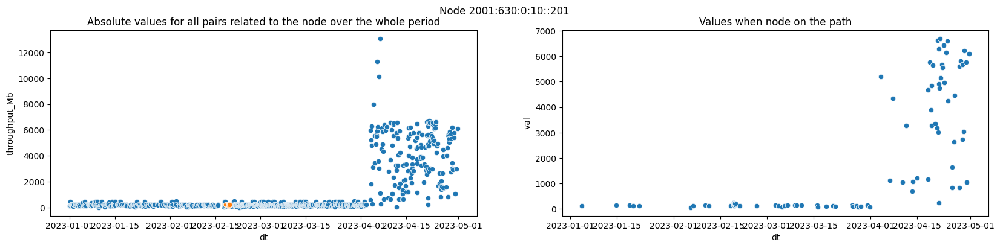

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 7 links
Start: 2023-02-15 00:19:08 --- End: 2023-02-19 09:11:11  --- AVG throughput: 250 Mbp/s


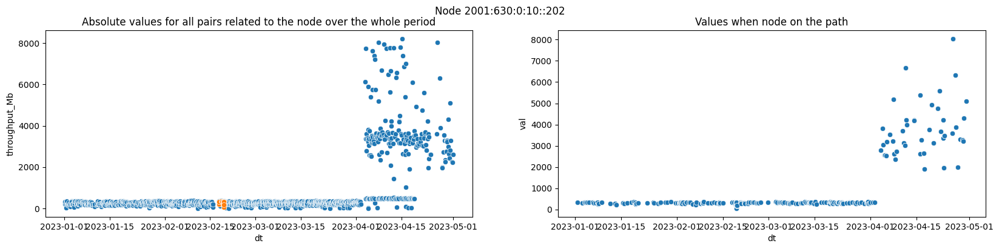

Possible issues close to UKI-NORTHGRID-LIV-HEP, found on 44 links
Start: 2023-01-15 03:41:50 --- End: 2023-01-15 22:39:22  --- AVG throughput: 635 Mbp/s
Start: 2023-01-16 00:28:24 --- End: 2023-01-20 19:22:05  --- AVG throughput: 517 Mbp/s
Start: 2023-01-24 02:53:16 --- End: 2023-01-25 03:00:25  --- AVG throughput: 529 Mbp/s
Start: 2023-01-30 05:42:23 --- End: 2023-01-30 22:12:10  --- AVG throughput: 665 Mbp/s
Start: 2023-02-01 04:20:57 --- End: 2023-02-04 23:11:48  --- AVG throughput: 608 Mbp/s
Start: 2023-02-05 02:21:41 --- End: 2023-02-09 02:39:29  --- AVG throughput: 593 Mbp/s
Start: 2023-02-09 06:48:03 --- End: 2023-02-09 22:41:28  --- AVG throughput: 484 Mbp/s
Start: 2023-02-10 02:51:10 --- End: 2023-02-14 22:50:45  --- AVG throughput: 607 Mbp/s
Start: 2023-02-15 01:57:54 --- End: 2023-02-19 23:40:43  --- AVG throughput: 602 Mbp/s
Start: 2023-02-20 02:39:41 --- End: 2023-02-24 23:42:05  --- AVG throughput: 696 Mbp/s
Start: 2023-02-25 01:49:12 --- End: 2023-03-02 00:03:56  --- AVG

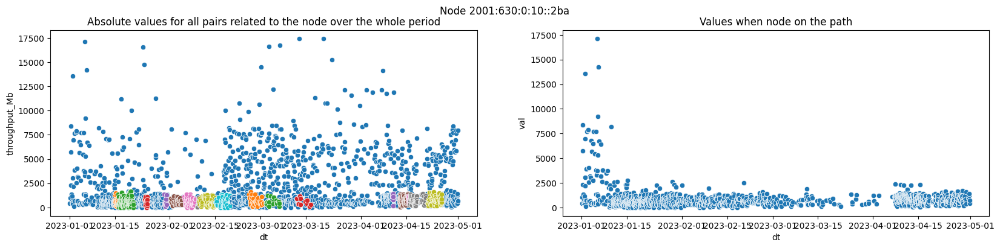

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 42 links
Start: 2023-01-04 05:14:51 --- End: 2023-01-05 23:16:29  --- AVG throughput: 240 Mbp/s
Start: 2023-01-07 07:24:24 --- End: 2023-01-10 23:50:20  --- AVG throughput: 211 Mbp/s
Start: 2023-01-16 01:17:44 --- End: 2023-01-20 23:33:45  --- AVG throughput: 234 Mbp/s
Start: 2023-01-24 06:07:29 --- End: 2023-01-25 22:55:33  --- AVG throughput: 255 Mbp/s
Start: 2023-01-30 05:43:26 --- End: 2023-01-30 23:03:45  --- AVG throughput: 236 Mbp/s
Start: 2023-02-04 02:12:10 --- End: 2023-02-04 23:26:22  --- AVG throughput: 218 Mbp/s
Start: 2023-02-13 13:35:22 --- End: 2023-02-14 22:39:58  --- AVG throughput: 209 Mbp/s


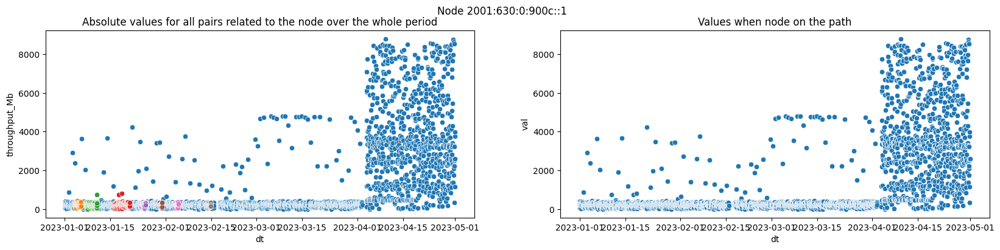

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 42 links
Start: 2023-01-01 03:08:10 --- End: 2023-01-05 22:45:33  --- AVG throughput: 197 Mbp/s
Start: 2023-01-06 02:48:55 --- End: 2023-01-10 23:06:21  --- AVG throughput: 183 Mbp/s
Start: 2023-01-11 01:26:53 --- End: 2023-01-15 22:10:20  --- AVG throughput: 206 Mbp/s
Start: 2023-01-16 01:45:40 --- End: 2023-01-20 20:09:13  --- AVG throughput: 183 Mbp/s
Start: 2023-01-21 01:16:20 --- End: 2023-01-25 21:57:53  --- AVG throughput: 160 Mbp/s
Start: 2023-01-26 02:31:59 --- End: 2023-01-30 23:27:13  --- AVG throughput: 202 Mbp/s
Start: 2023-01-31 02:08:32 --- End: 2023-02-04 21:18:09  --- AVG throughput: 183 Mbp/s
Start: 2023-02-05 01:19:12 --- End: 2023-02-09 20:57:15  --- AVG throughput: 161 Mbp/s
Start: 2023-02-10 01:26:12 --- End: 2023-02-14 19:39:01  --- AVG throughput: 189 Mbp/s
Start: 2023-02-15 03:09:43 --- End: 2023-02-19 23:41:40  --- AVG throughput: 192 Mbp/s
Start: 2023-02-20 01:32:17 --- End: 2023-02-24 23:54:14  --- AVG 

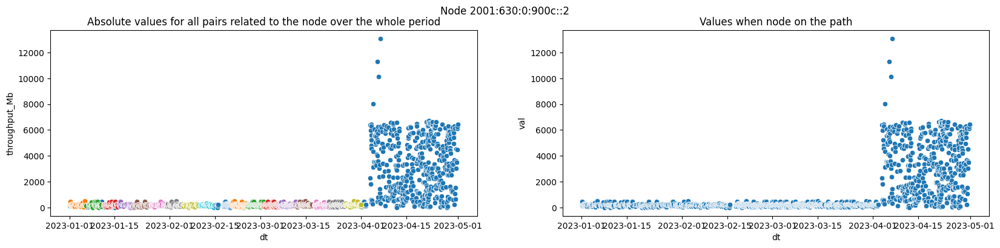

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 42 links
Start: 2023-01-04 05:14:51 --- End: 2023-01-05 23:16:29  --- AVG throughput: 238 Mbp/s
Start: 2023-01-07 07:24:24 --- End: 2023-01-10 23:50:20  --- AVG throughput: 209 Mbp/s
Start: 2023-01-16 01:17:44 --- End: 2023-01-20 23:33:45  --- AVG throughput: 233 Mbp/s
Start: 2023-01-24 06:07:29 --- End: 2023-01-25 22:55:33  --- AVG throughput: 252 Mbp/s
Start: 2023-01-30 05:43:26 --- End: 2023-01-30 23:03:45  --- AVG throughput: 233 Mbp/s
Start: 2023-02-04 02:12:10 --- End: 2023-02-04 23:26:22  --- AVG throughput: 218 Mbp/s
Start: 2023-02-13 13:35:22 --- End: 2023-02-14 22:39:58  --- AVG throughput: 209 Mbp/s


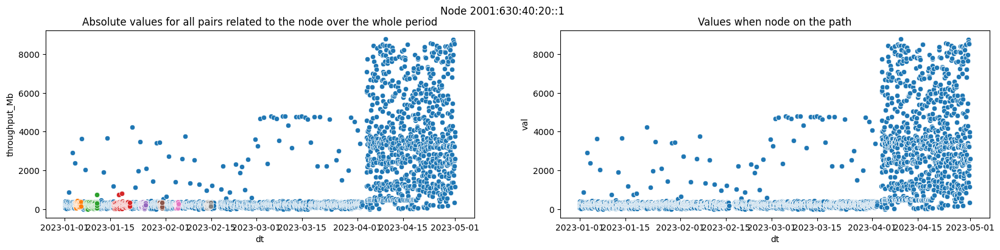

Possible issues close to UKI-SCOTGRID-GLASGOW, found on 42 links
Start: 2023-01-04 05:14:51 --- End: 2023-01-05 23:16:29  --- AVG throughput: 238 Mbp/s
Start: 2023-01-07 07:24:24 --- End: 2023-01-10 23:50:20  --- AVG throughput: 209 Mbp/s
Start: 2023-01-16 01:17:44 --- End: 2023-01-20 23:33:45  --- AVG throughput: 233 Mbp/s
Start: 2023-01-24 06:07:29 --- End: 2023-01-25 22:55:33  --- AVG throughput: 252 Mbp/s
Start: 2023-01-30 05:43:26 --- End: 2023-01-30 23:03:45  --- AVG throughput: 233 Mbp/s
Start: 2023-02-04 02:12:10 --- End: 2023-02-04 23:26:22  --- AVG throughput: 218 Mbp/s
Start: 2023-02-13 13:35:22 --- End: 2023-02-14 22:39:58  --- AVG throughput: 209 Mbp/s


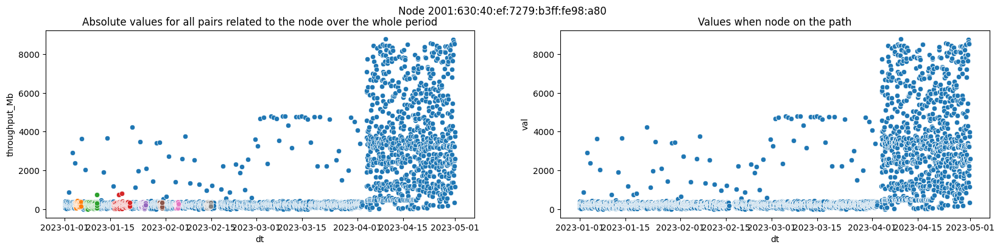

Possible issues close to GRIF, found on 7 links
Start: 2023-01-13 03:05:54 --- End: 2023-01-13 15:10:11  --- AVG throughput: 237 Mbp/s


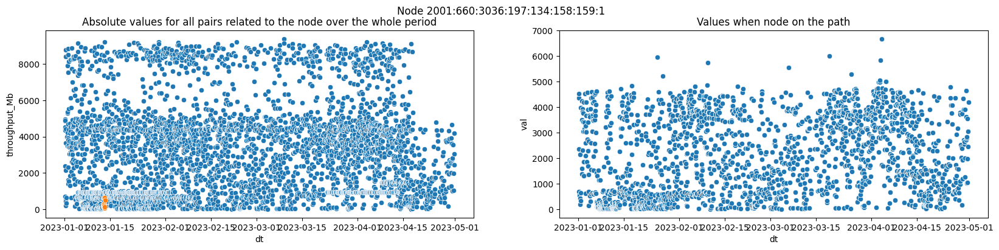

Possible issues close to IN2P3-CPPM, found on 36 links
Start: 2023-01-01 00:29:45 --- End: 2023-01-05 23:35:43  --- AVG throughput: 2831 Mbp/s
Start: 2023-01-06 03:08:16 --- End: 2023-01-10 23:59:27  --- AVG throughput: 803 Mbp/s
Start: 2023-01-11 00:39:54 --- End: 2023-01-15 23:34:26  --- AVG throughput: 2212 Mbp/s
Start: 2023-01-16 01:24:10 --- End: 2023-01-20 22:58:01  --- AVG throughput: 2205 Mbp/s
Start: 2023-01-21 00:18:33 --- End: 2023-01-25 22:41:23  --- AVG throughput: 1836 Mbp/s
Start: 2023-01-26 00:39:12 --- End: 2023-01-30 23:59:52  --- AVG throughput: 2231 Mbp/s
Start: 2023-01-31 00:15:13 --- End: 2023-02-05 00:10:05  --- AVG throughput: 2432 Mbp/s
Start: 2023-02-05 00:22:44 --- End: 2023-02-09 23:06:18  --- AVG throughput: 2175 Mbp/s
Start: 2023-02-10 01:05:12 --- End: 2023-02-14 23:51:56  --- AVG throughput: 2170 Mbp/s
Start: 2023-02-15 02:05:29 --- End: 2023-02-20 00:03:53  --- AVG throughput: 1938 Mbp/s
Start: 2023-02-20 00:17:03 --- End: 2023-02-25 00:08:47  --- AVG t

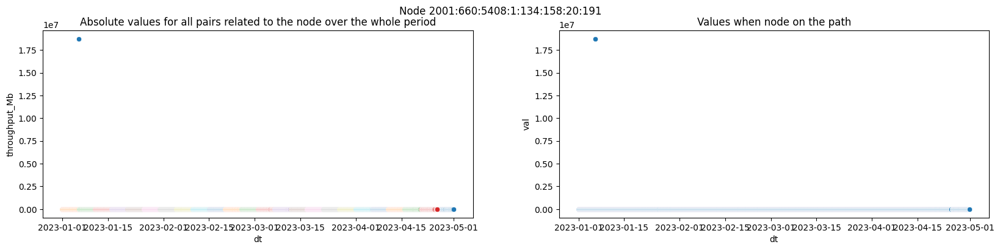

Possible issues close to IN2P3-CPPM, found on 37 links
Start: 2023-01-01 00:29:45 --- End: 2023-01-05 23:35:43  --- AVG throughput: 2826 Mbp/s
Start: 2023-01-06 03:08:16 --- End: 2023-01-10 23:59:27  --- AVG throughput: 801 Mbp/s
Start: 2023-01-11 00:39:54 --- End: 2023-01-16 00:01:53  --- AVG throughput: 2207 Mbp/s
Start: 2023-01-16 01:24:10 --- End: 2023-01-20 22:58:01  --- AVG throughput: 2204 Mbp/s
Start: 2023-01-21 00:18:33 --- End: 2023-01-25 22:41:23  --- AVG throughput: 1807 Mbp/s
Start: 2023-01-26 00:39:12 --- End: 2023-01-30 23:59:52  --- AVG throughput: 2199 Mbp/s
Start: 2023-01-31 00:15:13 --- End: 2023-02-05 00:10:05  --- AVG throughput: 2421 Mbp/s
Start: 2023-02-05 00:22:44 --- End: 2023-02-09 23:06:18  --- AVG throughput: 2157 Mbp/s
Start: 2023-02-10 01:05:12 --- End: 2023-02-14 23:51:56  --- AVG throughput: 2128 Mbp/s
Start: 2023-02-15 02:05:29 --- End: 2023-02-20 00:03:53  --- AVG throughput: 1920 Mbp/s
Start: 2023-02-20 00:17:03 --- End: 2023-02-25 00:08:47  --- AVG t

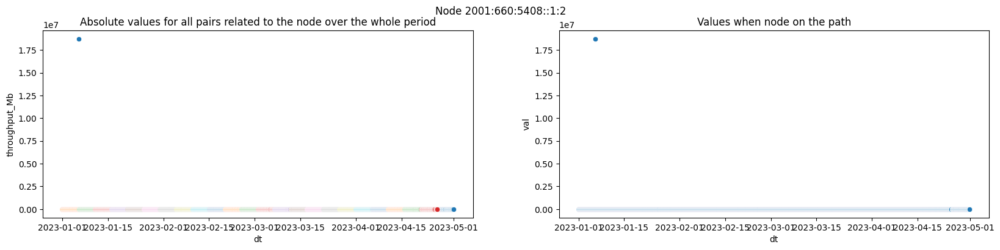

Possible issues close to IN2P3-SUBATECH, found on 5 links
Start: 2023-01-18 14:14:20 --- End: 2023-01-19 09:53:53  --- AVG throughput: 35 Mbp/s


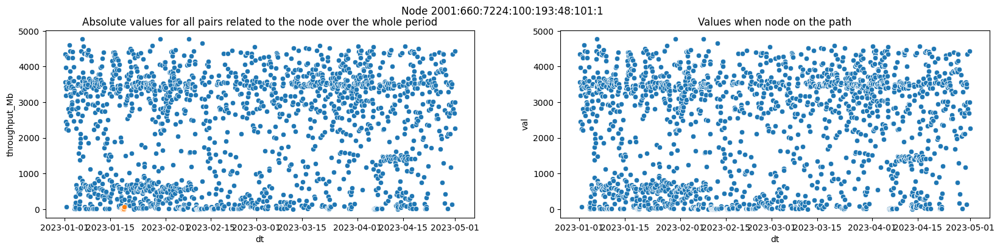

Possible issues close to IN2P3-CPPM, found on 25 links
Start: 2023-01-09 05:59:37 --- End: 2023-01-10 23:45:23  --- AVG throughput: 84 Mbp/s


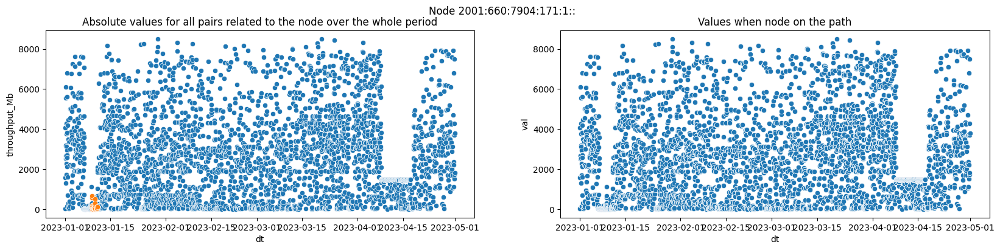

Possible issues close to IN2P3-CPPM, found on 19 links
Start: 2023-01-10 14:53:20 --- End: 2023-01-10 22:30:31  --- AVG throughput: 42 Mbp/s


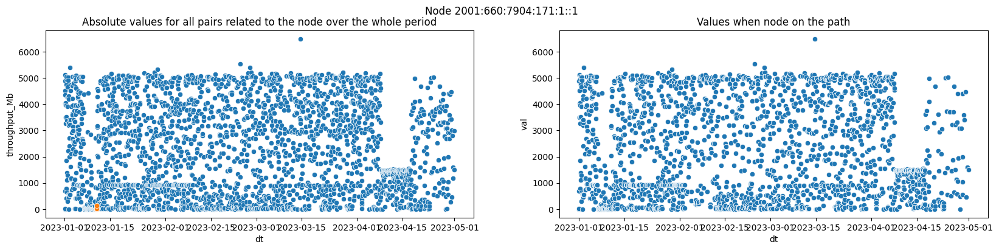

Possible issues close to GRIF, found on 7 links
Start: 2023-01-13 03:05:54 --- End: 2023-01-13 15:10:11  --- AVG throughput: 237 Mbp/s


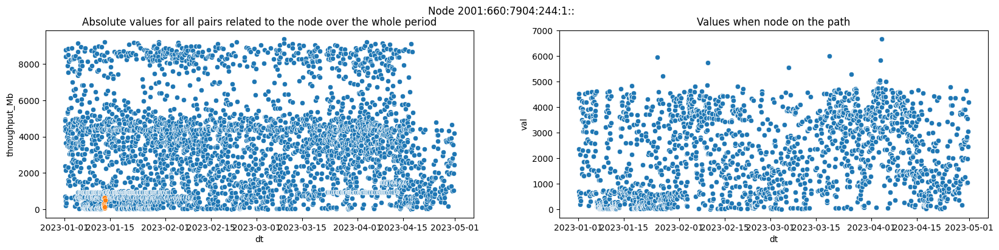

Possible issues close to IN2P3-SUBATECH, found on 5 links
Start: 2023-01-18 14:14:20 --- End: 2023-01-19 09:53:53  --- AVG throughput: 35 Mbp/s
Start: 2023-02-10 08:46:07 --- End: 2023-02-11 22:38:41  --- AVG throughput: 17 Mbp/s


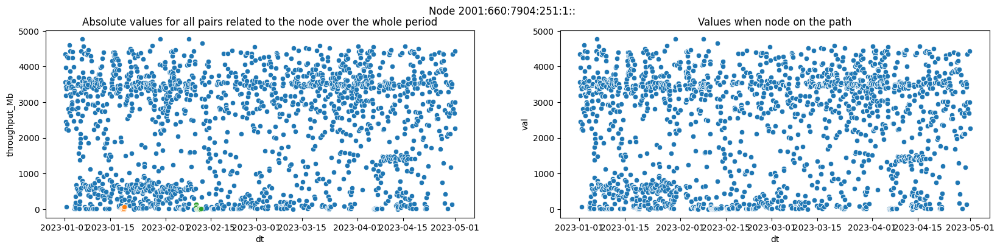

Possible issues close to PIC, found on 16 links
Start: 2023-01-11 02:30:48 --- End: 2023-01-15 19:42:53  --- AVG throughput: 151 Mbp/s


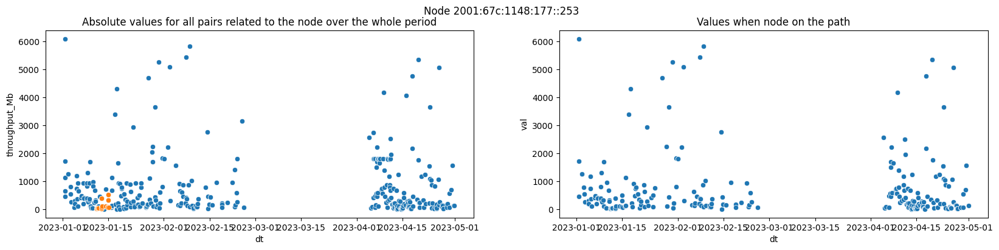

Possible issues close to JINR-LCG2, found on 39 links
Start: 2023-01-01 00:40:27 --- End: 2023-01-04 11:07:32  --- AVG throughput: 166 Mbp/s
Start: 2023-01-04 12:02:34 --- End: 2023-01-06 00:04:08  --- AVG throughput: 369 Mbp/s


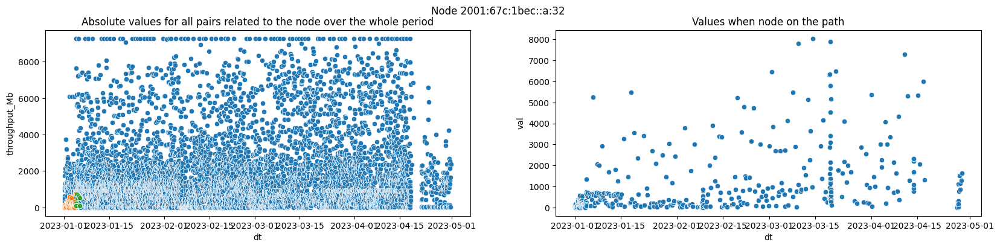

Possible issues close to BEGRID-ULB-VUB, found on 40 links
Start: 2023-02-10 13:27:08 --- End: 2023-02-11 07:54:56  --- AVG throughput: 332 Mbp/s


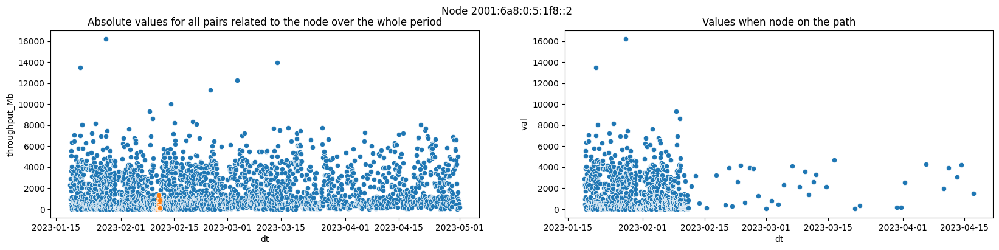

Possible issues close to CIEMAT-LCG2, found on 13 links
Start: 2023-01-14 03:34:00 --- End: 2023-01-15 20:24:07  --- AVG throughput: 755 Mbp/s
Start: 2023-04-01 01:16:03 --- End: 2023-04-05 22:07:58  --- AVG throughput: 663 Mbp/s
Start: 2023-04-12 19:47:33 --- End: 2023-04-15 23:13:31  --- AVG throughput: 534 Mbp/s


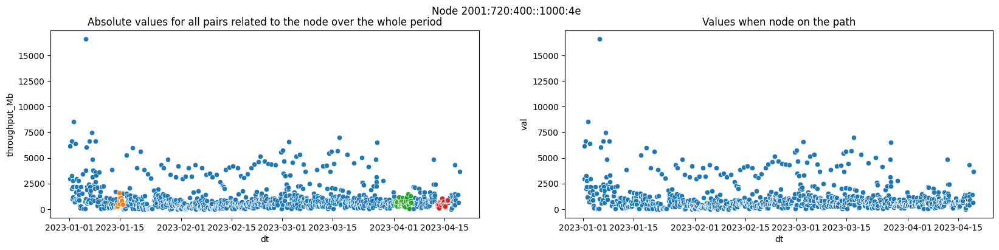

Possible issues close to CIEMAT-LCG2, found on 19 links
Start: 2023-01-01 00:40:07 --- End: 2023-01-05 23:37:16  --- AVG throughput: 8 Mbp/s
Start: 2023-01-06 01:48:33 --- End: 2023-01-10 23:19:57  --- AVG throughput: 8 Mbp/s
Start: 2023-01-11 00:17:11 --- End: 2023-01-15 23:16:35  --- AVG throughput: 8 Mbp/s
Start: 2023-01-16 09:30:28 --- End: 2023-01-20 18:36:31  --- AVG throughput: 5 Mbp/s
Start: 2023-01-21 05:16:28 --- End: 2023-01-25 23:18:54  --- AVG throughput: 6 Mbp/s
Start: 2023-01-26 02:22:53 --- End: 2023-01-30 23:01:23  --- AVG throughput: 5 Mbp/s
Start: 2023-01-31 00:19:14 --- End: 2023-02-04 23:32:32  --- AVG throughput: 4 Mbp/s
Start: 2023-02-05 00:25:36 --- End: 2023-02-09 19:17:03  --- AVG throughput: 4 Mbp/s
Start: 2023-02-10 03:02:14 --- End: 2023-02-14 20:47:48  --- AVG throughput: 4 Mbp/s
Start: 2023-02-15 02:09:58 --- End: 2023-02-19 23:16:07  --- AVG throughput: 5 Mbp/s
Start: 2023-02-20 00:44:03 --- End: 2023-02-24 21:59:19  --- AVG throughput: 3 Mbp/s
Start: 20

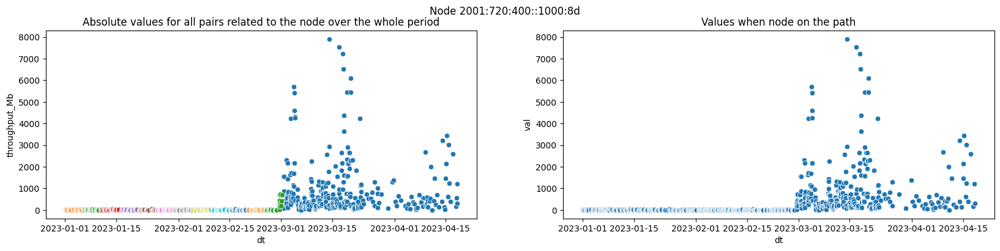

Possible issues close to CIEMAT-LCG2, found on 14 links
Start: 2023-01-21 22:38:28 --- End: 2023-01-24 00:52:25  --- AVG throughput: 93 Mbp/s


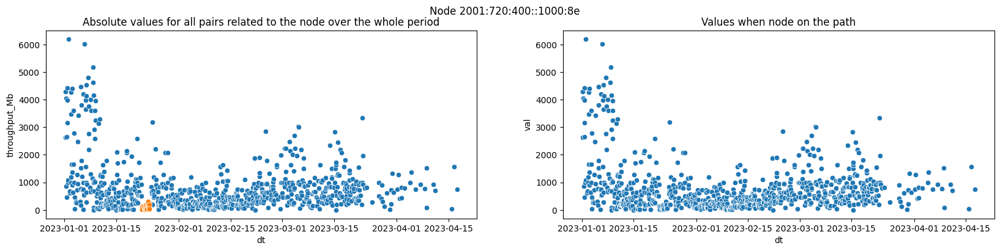

Possible issues close to CIEMAT-LCG2, found on 17 links
Start: 2023-01-01 03:13:35 --- End: 2023-01-05 21:04:37  --- AVG throughput: 9 Mbp/s
Start: 2023-01-06 02:48:04 --- End: 2023-01-10 23:35:13  --- AVG throughput: 8 Mbp/s
Start: 2023-01-11 00:31:17 --- End: 2023-01-15 20:29:42  --- AVG throughput: 8 Mbp/s
Start: 2023-01-16 00:28:24 --- End: 2023-01-20 16:37:39  --- AVG throughput: 6 Mbp/s
Start: 2023-01-21 10:28:54 --- End: 2023-01-25 23:59:36  --- AVG throughput: 7 Mbp/s
Start: 2023-01-26 02:20:36 --- End: 2023-01-30 21:58:47  --- AVG throughput: 4 Mbp/s
Start: 2023-01-31 00:12:29 --- End: 2023-02-04 23:29:00  --- AVG throughput: 5 Mbp/s
Start: 2023-02-05 13:28:08 --- End: 2023-02-09 18:51:29  --- AVG throughput: 4 Mbp/s
Start: 2023-02-10 01:34:17 --- End: 2023-02-14 14:10:57  --- AVG throughput: 4 Mbp/s
Start: 2023-02-15 03:53:00 --- End: 2023-02-19 22:39:21  --- AVG throughput: 6 Mbp/s
Start: 2023-02-20 00:16:49 --- End: 2023-02-25 00:06:15  --- AVG throughput: 4 Mbp/s
Start: 20

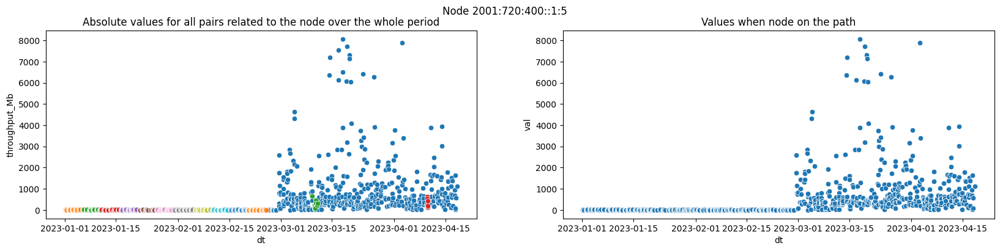

Possible issues close to CIEMAT-LCG2, found on 25 links
Start: 2023-01-13 22:51:48 --- End: 2023-01-15 04:47:53  --- AVG throughput: 566 Mbp/s
Start: 2023-01-15 11:38:12 --- End: 2023-01-15 20:24:07  --- AVG throughput: 609 Mbp/s
Start: 2023-01-30 14:00:06 --- End: 2023-01-30 23:57:10  --- AVG throughput: 395 Mbp/s
Start: 2023-02-03 21:34:17 --- End: 2023-02-04 08:08:38  --- AVG throughput: 426 Mbp/s
Start: 2023-02-04 11:58:52 --- End: 2023-02-04 18:42:51  --- AVG throughput: 290 Mbp/s
Start: 2023-02-09 17:54:53 --- End: 2023-02-10 00:08:25  --- AVG throughput: 26 Mbp/s
Start: 2023-02-14 15:04:15 --- End: 2023-02-14 21:45:33  --- AVG throughput: 453 Mbp/s
Start: 2023-03-10 15:35:42 --- End: 2023-03-11 06:14:57  --- AVG throughput: 684 Mbp/s
Start: 2023-03-11 09:26:11 --- End: 2023-03-11 22:49:43  --- AVG throughput: 628 Mbp/s
Start: 2023-03-20 23:22:05 --- End: 2023-03-21 22:27:34  --- AVG throughput: 646 Mbp/s
Start: 2023-04-01 01:16:03 --- End: 2023-04-05 22:07:58  --- AVG throughput

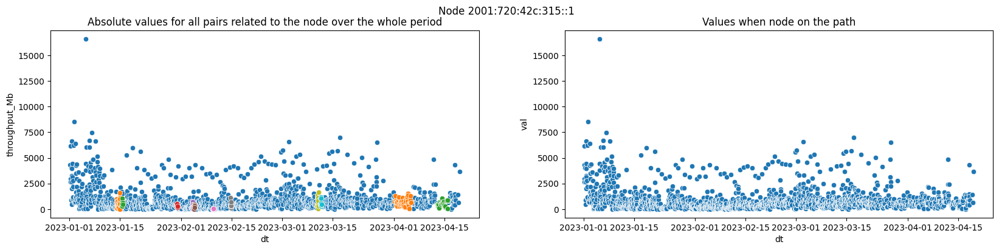

Possible issues close to CIEMAT-LCG2, found on 32 links
Start: 2023-01-01 00:40:07 --- End: 2023-01-05 23:37:16  --- AVG throughput: 8 Mbp/s
Start: 2023-01-06 01:48:33 --- End: 2023-01-10 23:35:13  --- AVG throughput: 8 Mbp/s
Start: 2023-01-11 00:17:11 --- End: 2023-01-15 23:16:35  --- AVG throughput: 8 Mbp/s
Start: 2023-01-16 00:28:24 --- End: 2023-01-20 18:36:31  --- AVG throughput: 6 Mbp/s
Start: 2023-01-21 05:16:28 --- End: 2023-01-25 23:59:36  --- AVG throughput: 6 Mbp/s
Start: 2023-01-26 02:20:36 --- End: 2023-01-30 23:01:23  --- AVG throughput: 4 Mbp/s
Start: 2023-01-31 00:12:29 --- End: 2023-02-04 23:32:32  --- AVG throughput: 4 Mbp/s
Start: 2023-02-05 00:25:36 --- End: 2023-02-09 19:17:03  --- AVG throughput: 4 Mbp/s
Start: 2023-02-10 01:34:17 --- End: 2023-02-14 20:47:48  --- AVG throughput: 4 Mbp/s
Start: 2023-02-15 02:09:58 --- End: 2023-02-19 23:16:07  --- AVG throughput: 5 Mbp/s
Start: 2023-02-20 00:16:49 --- End: 2023-02-25 00:06:15  --- AVG throughput: 4 Mbp/s
Start: 20

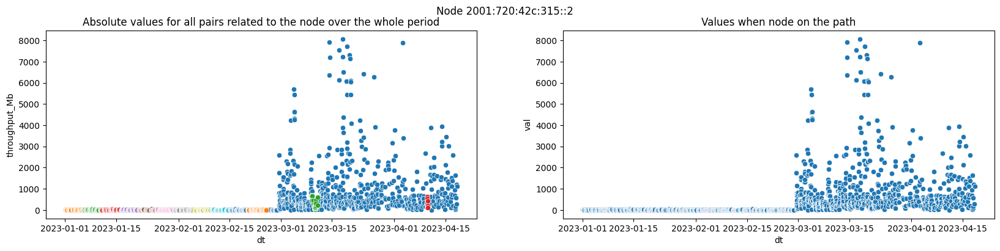

Possible issues close to CIEMAT-LCG2, found on 32 links
Start: 2023-01-01 00:40:07 --- End: 2023-01-05 23:37:16  --- AVG throughput: 8 Mbp/s
Start: 2023-01-06 01:48:33 --- End: 2023-01-10 23:35:13  --- AVG throughput: 8 Mbp/s
Start: 2023-01-11 00:17:11 --- End: 2023-01-15 23:16:35  --- AVG throughput: 8 Mbp/s
Start: 2023-01-16 00:28:24 --- End: 2023-01-20 18:36:31  --- AVG throughput: 6 Mbp/s
Start: 2023-01-21 05:16:28 --- End: 2023-01-25 23:59:36  --- AVG throughput: 6 Mbp/s
Start: 2023-01-26 02:20:36 --- End: 2023-01-30 23:01:23  --- AVG throughput: 4 Mbp/s
Start: 2023-01-31 00:12:29 --- End: 2023-02-04 23:32:32  --- AVG throughput: 4 Mbp/s
Start: 2023-02-05 00:25:36 --- End: 2023-02-09 19:17:03  --- AVG throughput: 4 Mbp/s
Start: 2023-02-10 01:34:17 --- End: 2023-02-14 20:47:48  --- AVG throughput: 4 Mbp/s
Start: 2023-02-15 02:09:58 --- End: 2023-02-19 23:16:07  --- AVG throughput: 5 Mbp/s
Start: 2023-02-20 00:16:49 --- End: 2023-02-25 00:06:15  --- AVG throughput: 4 Mbp/s
Start: 20

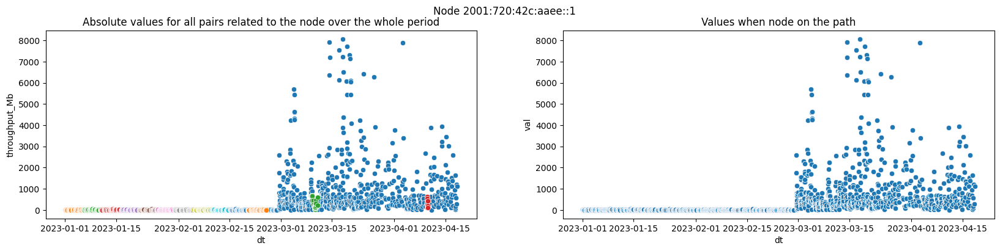

Possible issues close to CIEMAT-LCG2, found on 27 links
Start: 2023-01-13 22:51:48 --- End: 2023-01-15 04:47:53  --- AVG throughput: 553 Mbp/s
Start: 2023-01-15 11:38:12 --- End: 2023-01-15 21:45:29  --- AVG throughput: 696 Mbp/s
Start: 2023-01-23 17:41:44 --- End: 2023-01-24 00:52:25  --- AVG throughput: 122 Mbp/s
Start: 2023-01-24 19:42:05 --- End: 2023-01-25 13:10:28  --- AVG throughput: 803 Mbp/s
Start: 2023-01-30 14:00:06 --- End: 2023-01-30 23:57:10  --- AVG throughput: 435 Mbp/s
Start: 2023-02-03 21:34:17 --- End: 2023-02-04 08:08:38  --- AVG throughput: 396 Mbp/s
Start: 2023-02-04 11:58:52 --- End: 2023-02-04 21:55:00  --- AVG throughput: 387 Mbp/s
Start: 2023-02-09 17:54:53 --- End: 2023-02-10 00:08:25  --- AVG throughput: 26 Mbp/s
Start: 2023-02-14 12:42:12 --- End: 2023-02-14 21:45:33  --- AVG throughput: 455 Mbp/s
Start: 2023-02-19 11:04:02 --- End: 2023-02-20 00:09:47  --- AVG throughput: 509 Mbp/s
Start: 2023-03-10 15:35:42 --- End: 2023-03-11 06:14:57  --- AVG throughput

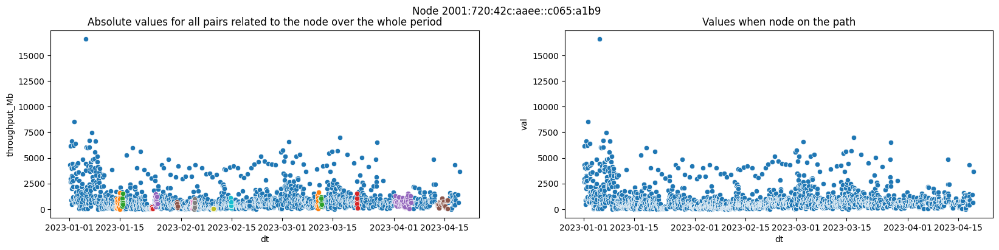

Possible issues close to CIEMAT-LCG2, found on 13 links
Start: 2023-01-14 03:34:00 --- End: 2023-01-15 20:24:07  --- AVG throughput: 755 Mbp/s


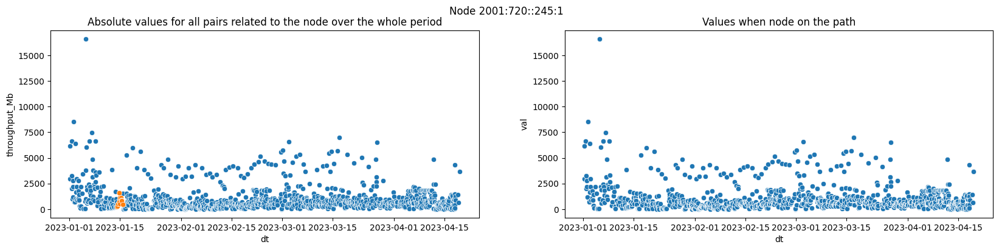

Possible issues close to CIEMAT-LCG2, found on 16 links
Start: 2023-01-01 03:13:35 --- End: 2023-01-05 21:04:37  --- AVG throughput: 9 Mbp/s
Start: 2023-01-06 02:48:04 --- End: 2023-01-10 23:35:13  --- AVG throughput: 8 Mbp/s
Start: 2023-01-11 00:31:17 --- End: 2023-01-15 20:29:42  --- AVG throughput: 8 Mbp/s
Start: 2023-01-16 00:28:24 --- End: 2023-01-20 16:37:39  --- AVG throughput: 6 Mbp/s
Start: 2023-01-21 10:28:54 --- End: 2023-01-25 23:59:36  --- AVG throughput: 7 Mbp/s
Start: 2023-01-26 02:20:36 --- End: 2023-01-30 21:58:47  --- AVG throughput: 4 Mbp/s
Start: 2023-01-31 00:12:29 --- End: 2023-02-04 23:29:00  --- AVG throughput: 5 Mbp/s
Start: 2023-02-05 13:28:08 --- End: 2023-02-09 18:51:29  --- AVG throughput: 4 Mbp/s
Start: 2023-02-10 01:34:17 --- End: 2023-02-14 14:10:57  --- AVG throughput: 4 Mbp/s
Start: 2023-02-15 03:53:00 --- End: 2023-02-19 22:39:21  --- AVG throughput: 6 Mbp/s
Start: 2023-02-20 00:16:49 --- End: 2023-02-25 00:06:15  --- AVG throughput: 4 Mbp/s
Start: 20

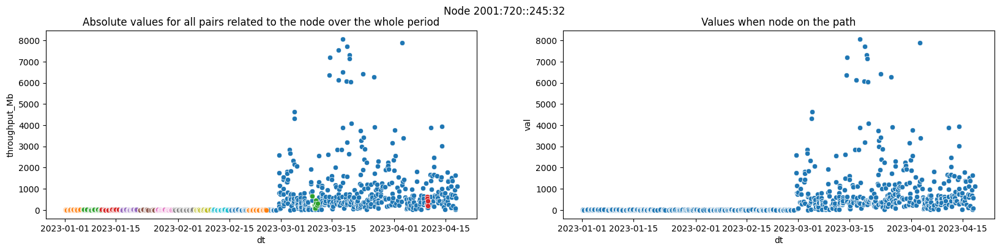

Possible issues close to BUDAPEST, found on 22 links
Start: 2023-03-07 00:13:18 --- End: 2023-03-11 17:22:04  --- AVG throughput: 64 Mbp/s


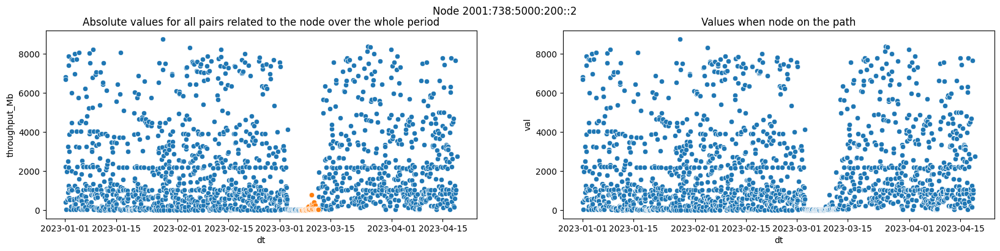

Possible issues close to BUDAPEST, found on 21 links
Start: 2023-03-07 00:13:18 --- End: 2023-03-11 17:22:04  --- AVG throughput: 65 Mbp/s


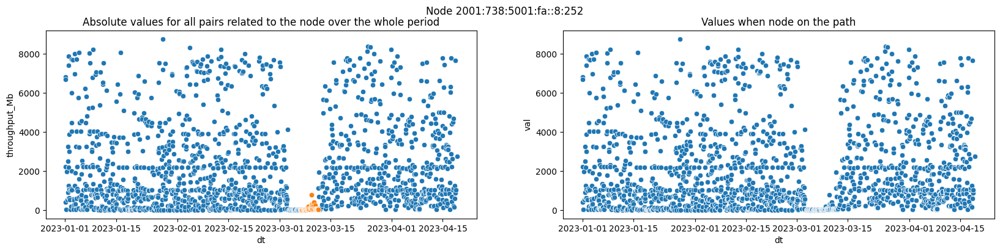

Possible issues close to BUDAPEST, found on 22 links
Start: 2023-03-07 00:13:18 --- End: 2023-03-11 17:22:04  --- AVG throughput: 64 Mbp/s


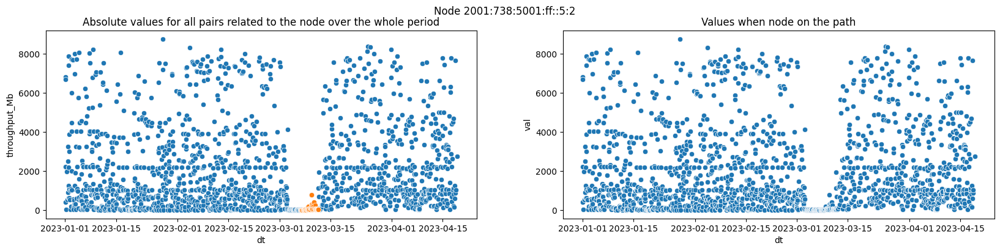

Possible issues close to BUDAPEST, found on 21 links
Start: 2023-03-07 00:13:18 --- End: 2023-03-11 17:22:04  --- AVG throughput: 64 Mbp/s


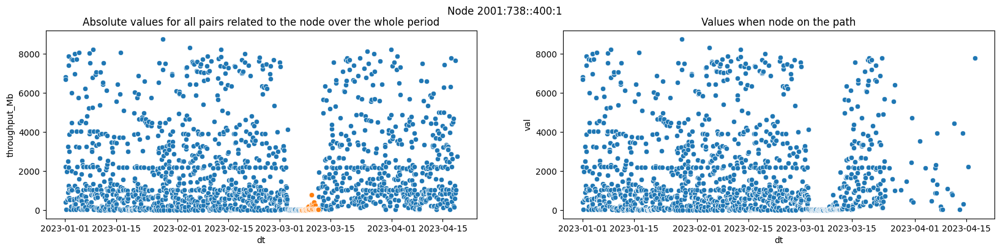

Possible issues close to BUDAPEST, found on 20 links
Start: 2023-03-07 00:13:18 --- End: 2023-03-11 17:22:04  --- AVG throughput: 65 Mbp/s


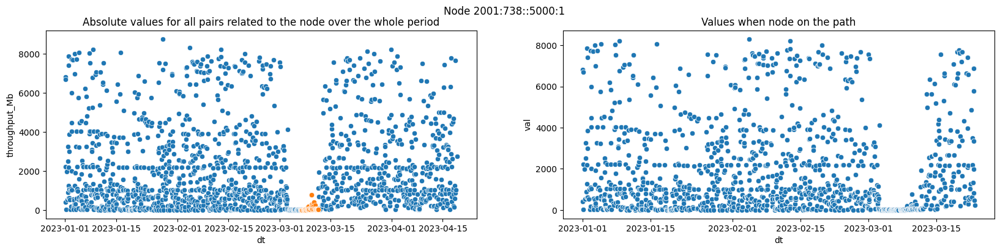

Possible issues close to INFN-FRASCATI, found on 39 links
Start: 2023-01-01 06:12:48 --- End: 2023-01-05 20:03:02  --- AVG throughput: 1300 Mbp/s
Start: 2023-01-06 18:24:47 --- End: 2023-01-10 23:27:58  --- AVG throughput: 1155 Mbp/s
Start: 2023-01-11 00:15:00 --- End: 2023-01-15 21:20:37  --- AVG throughput: 1243 Mbp/s
Start: 2023-01-16 04:49:15 --- End: 2023-01-21 00:05:46  --- AVG throughput: 1491 Mbp/s
Start: 2023-01-21 00:56:38 --- End: 2023-01-26 00:09:21  --- AVG throughput: 1014 Mbp/s
Start: 2023-01-26 01:13:29 --- End: 2023-01-30 21:48:26  --- AVG throughput: 1072 Mbp/s
Start: 2023-01-31 00:32:15 --- End: 2023-02-04 23:43:58  --- AVG throughput: 1101 Mbp/s
Start: 2023-02-05 00:25:57 --- End: 2023-02-09 23:04:46  --- AVG throughput: 1467 Mbp/s
Start: 2023-02-10 00:21:18 --- End: 2023-02-14 18:31:34  --- AVG throughput: 1628 Mbp/s
Start: 2023-02-15 07:14:39 --- End: 2023-02-19 20:02:27  --- AVG throughput: 1615 Mbp/s
Start: 2023-02-20 03:14:58 --- End: 2023-02-24 23:49:40  --- A

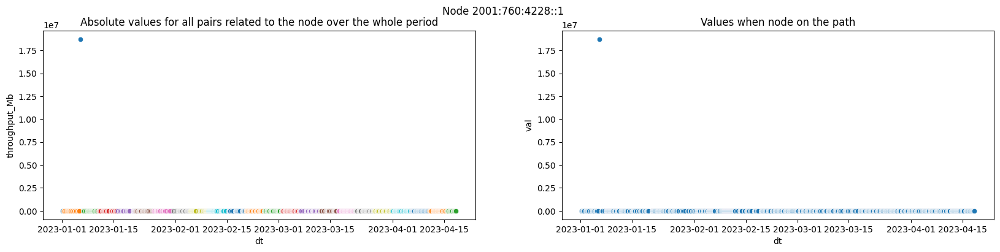

Possible issues close to INFN-FRASCATI, found on 23 links
Start: 2023-02-09 14:35:21 --- End: 2023-02-09 23:15:34  --- AVG throughput: 132 Mbp/s
Start: 2023-03-27 14:55:35 --- End: 2023-03-31 06:17:23  --- AVG throughput: 44 Mbp/s


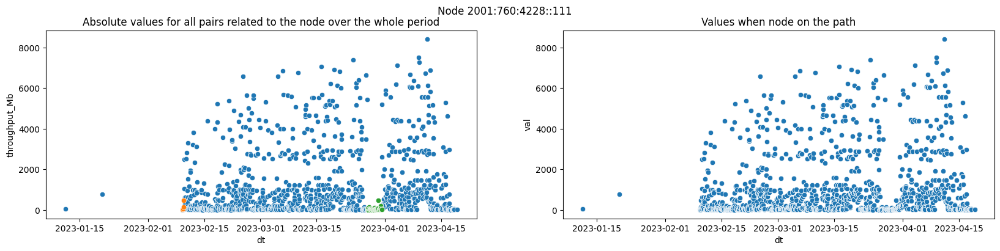

Possible issues close to INFN-FRASCATI, found on 39 links
Start: 2023-01-01 06:12:48 --- End: 2023-01-05 20:03:02  --- AVG throughput: 1300 Mbp/s
Start: 2023-01-06 18:24:47 --- End: 2023-01-10 23:27:58  --- AVG throughput: 1130 Mbp/s
Start: 2023-01-11 00:15:00 --- End: 2023-01-15 21:20:37  --- AVG throughput: 1253 Mbp/s
Start: 2023-01-16 04:49:15 --- End: 2023-01-21 00:05:46  --- AVG throughput: 1491 Mbp/s
Start: 2023-01-21 00:56:38 --- End: 2023-01-26 00:09:21  --- AVG throughput: 1014 Mbp/s
Start: 2023-01-26 01:13:29 --- End: 2023-01-30 21:48:26  --- AVG throughput: 1072 Mbp/s
Start: 2023-01-31 00:32:15 --- End: 2023-02-04 23:43:58  --- AVG throughput: 1103 Mbp/s
Start: 2023-02-05 00:25:57 --- End: 2023-02-09 23:04:46  --- AVG throughput: 1467 Mbp/s
Start: 2023-02-10 00:21:18 --- End: 2023-02-14 18:31:34  --- AVG throughput: 1628 Mbp/s
Start: 2023-02-15 07:14:39 --- End: 2023-02-19 20:02:27  --- AVG throughput: 1615 Mbp/s
Start: 2023-02-20 03:14:58 --- End: 2023-02-24 23:49:40  --- A

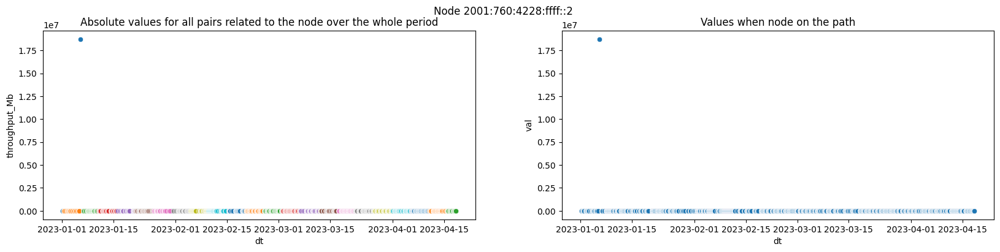

Possible issues close to INFN-FRASCATI, found on 23 links
Start: 2023-02-09 14:35:21 --- End: 2023-02-09 23:15:34  --- AVG throughput: 132 Mbp/s
Start: 2023-03-27 14:55:35 --- End: 2023-03-31 06:17:23  --- AVG throughput: 45 Mbp/s


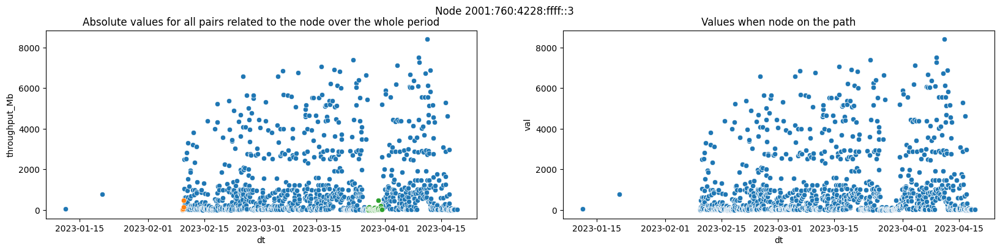

Possible issues close to INFN-T1, found on 20 links
Start: 2023-03-09 12:04:14 --- End: 2023-03-11 16:53:23  --- AVG throughput: 462 Mbp/s


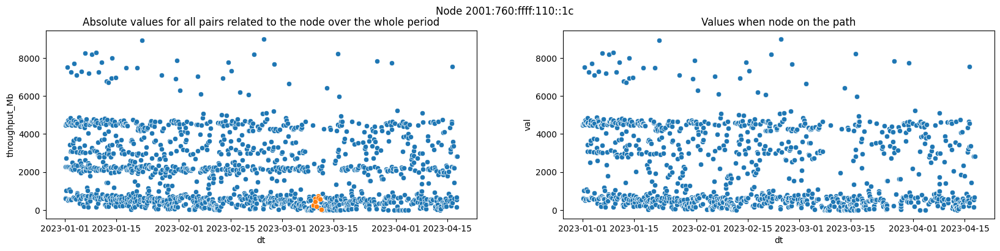

Possible issues close to INFN-FRASCATI, found on 9 links
Start: 2023-03-27 09:44:50 --- End: 2023-03-31 06:30:31  --- AVG throughput: 50 Mbp/s
Start: 2023-04-16 19:19:55 --- End: 2023-04-18 01:06:01  --- AVG throughput: 14 Mbp/s


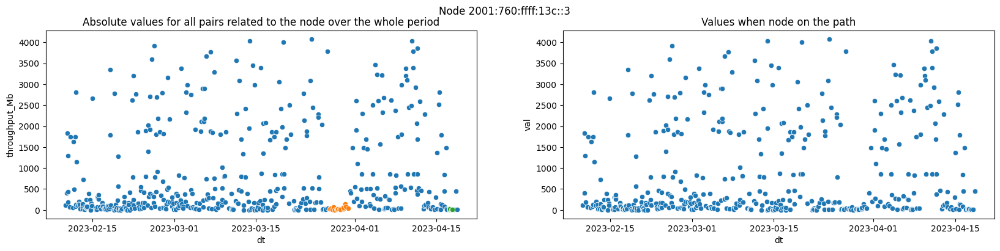

Possible issues close to INFN-FRASCATI, found on 48 links
Start: 2023-01-01 13:45:15 --- End: 2023-01-05 20:03:02  --- AVG throughput: 1246 Mbp/s
Start: 2023-01-06 18:24:47 --- End: 2023-01-10 23:27:58  --- AVG throughput: 1104 Mbp/s
Start: 2023-01-11 00:15:00 --- End: 2023-01-15 21:20:37  --- AVG throughput: 1195 Mbp/s
Start: 2023-01-16 04:49:15 --- End: 2023-01-21 00:04:37  --- AVG throughput: 1458 Mbp/s
Start: 2023-01-21 00:56:38 --- End: 2023-01-25 12:47:49  --- AVG throughput: 980 Mbp/s
Start: 2023-01-26 01:30:29 --- End: 2023-01-30 03:15:06  --- AVG throughput: 1219 Mbp/s
Start: 2023-01-31 00:32:15 --- End: 2023-02-04 23:43:58  --- AVG throughput: 1093 Mbp/s
Start: 2023-02-05 00:25:57 --- End: 2023-02-09 23:15:34  --- AVG throughput: 1243 Mbp/s
Start: 2023-02-10 00:21:18 --- End: 2023-02-14 23:52:37  --- AVG throughput: 818 Mbp/s
Start: 2023-02-15 00:34:26 --- End: 2023-02-20 00:00:02  --- AVG throughput: 577 Mbp/s
Start: 2023-02-20 00:25:12 --- End: 2023-02-24 23:59:58  --- AVG 

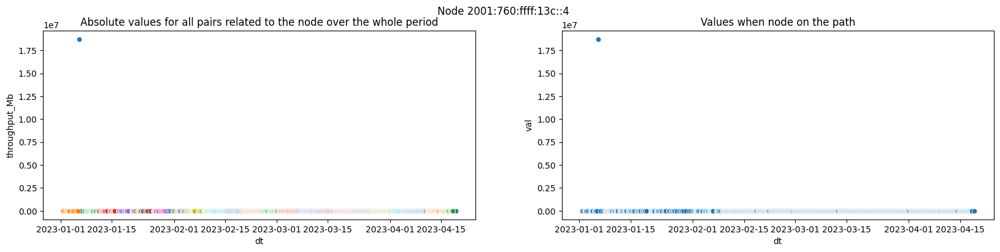

Possible issues close to INFN-FRASCATI, found on 22 links
Start: 2023-02-09 14:35:21 --- End: 2023-02-09 23:15:34  --- AVG throughput: 132 Mbp/s
Start: 2023-03-27 15:46:31 --- End: 2023-03-31 06:50:50  --- AVG throughput: 52 Mbp/s


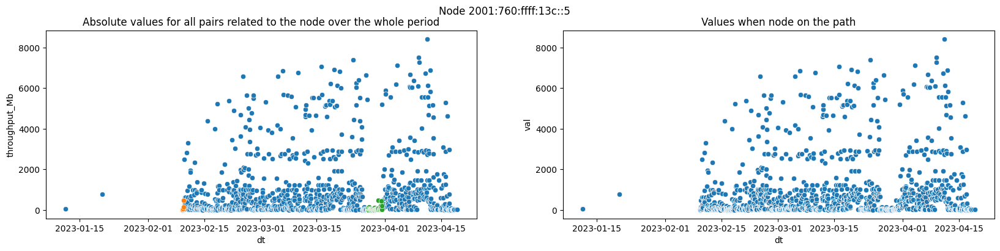

Possible issues close to INFN-T1, found on 26 links
Start: 2023-03-07 17:35:24 --- End: 2023-03-11 08:30:36  --- AVG throughput: 244 Mbp/s


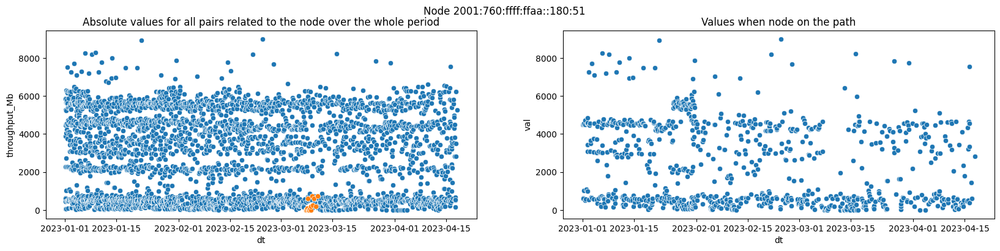

Possible issues close to INFN-FRASCATI, found on 17 links
Start: 2023-02-17 15:53:05 --- End: 2023-02-18 05:33:07  --- AVG throughput: 126 Mbp/s
Start: 2023-02-18 21:01:18 --- End: 2023-02-20 00:00:02  --- AVG throughput: 162 Mbp/s


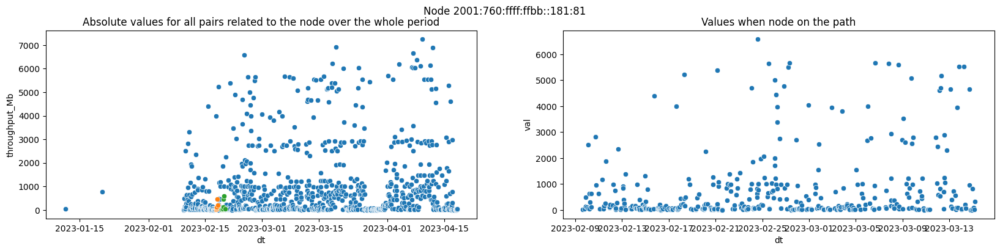

Possible issues close to INFN-FRASCATI, found on 8 links
Start: 2023-02-18 03:04:05 --- End: 2023-02-19 23:23:05  --- AVG throughput: 56 Mbp/s


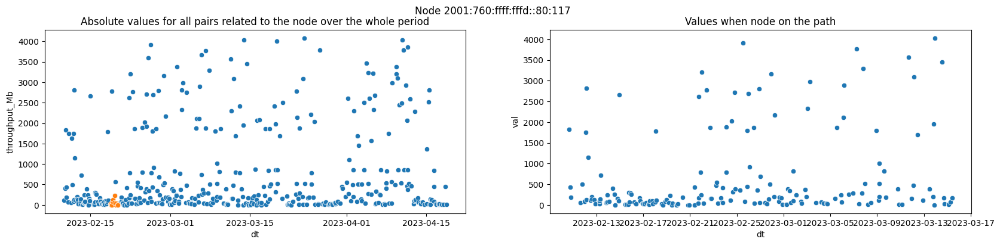

Possible issues close to INFN-FRASCATI, found on 9 links
Start: 2023-03-27 09:44:50 --- End: 2023-03-30 21:09:50  --- AVG throughput: 36 Mbp/s


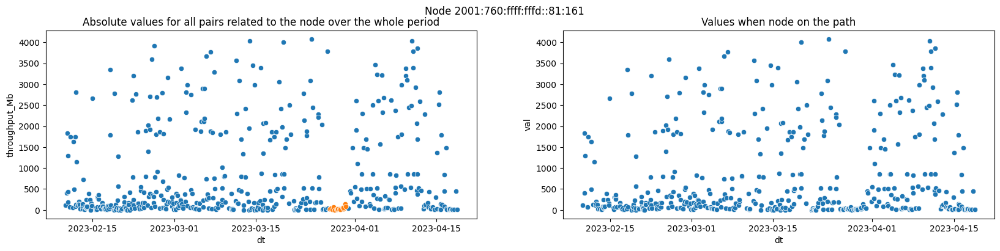

Possible issues close to INFN-T1, found on 28 links
Start: 2023-01-01 00:51:20 --- End: 2023-01-06 00:03:28  --- AVG throughput: 2563 Mbp/s
Start: 2023-01-06 03:11:20 --- End: 2023-01-10 23:27:58  --- AVG throughput: 2262 Mbp/s
Start: 2023-01-11 00:15:00 --- End: 2023-01-15 22:48:31  --- AVG throughput: 2853 Mbp/s
Start: 2023-01-16 00:23:49 --- End: 2023-01-21 00:11:51  --- AVG throughput: 2662 Mbp/s
Start: 2023-01-21 00:56:38 --- End: 2023-01-25 23:33:37  --- AVG throughput: 2610 Mbp/s
Start: 2023-01-26 00:33:54 --- End: 2023-01-30 23:54:35  --- AVG throughput: 2579 Mbp/s
Start: 2023-01-31 00:23:46 --- End: 2023-02-04 23:50:15  --- AVG throughput: 2417 Mbp/s
Start: 2023-02-05 00:57:42 --- End: 2023-02-09 23:47:35  --- AVG throughput: 2277 Mbp/s
Start: 2023-02-10 00:21:18 --- End: 2023-02-14 23:42:50  --- AVG throughput: 2504 Mbp/s
Start: 2023-02-15 02:06:32 --- End: 2023-02-19 23:27:13  --- AVG throughput: 2189 Mbp/s
Start: 2023-02-20 00:34:48 --- End: 2023-02-25 00:06:08  --- AVG thr

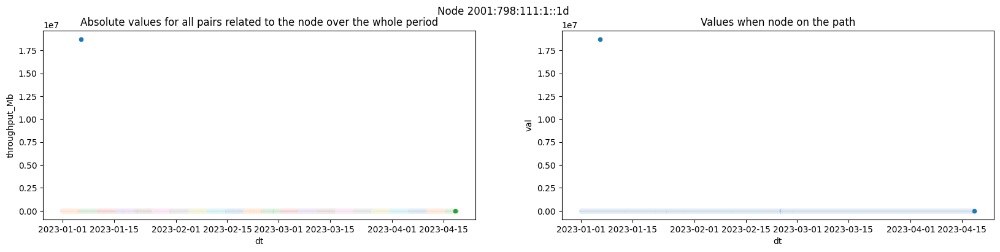

Possible issues close to INFN-T1, found on 49 links
Start: 2023-01-01 00:51:20 --- End: 2023-01-06 00:03:28  --- AVG throughput: 2774 Mbp/s
Start: 2023-01-06 03:11:20 --- End: 2023-01-10 23:27:58  --- AVG throughput: 2365 Mbp/s
Start: 2023-01-11 00:15:00 --- End: 2023-01-15 22:48:31  --- AVG throughput: 2956 Mbp/s
Start: 2023-01-16 00:23:49 --- End: 2023-01-21 00:11:51  --- AVG throughput: 2726 Mbp/s
Start: 2023-01-21 00:56:38 --- End: 2023-01-25 23:33:37  --- AVG throughput: 2837 Mbp/s
Start: 2023-01-26 00:33:54 --- End: 2023-01-30 23:54:35  --- AVG throughput: 2799 Mbp/s
Start: 2023-01-31 00:23:46 --- End: 2023-02-04 23:58:02  --- AVG throughput: 2553 Mbp/s
Start: 2023-02-05 00:57:42 --- End: 2023-02-09 23:47:35  --- AVG throughput: 2277 Mbp/s
Start: 2023-02-10 00:21:18 --- End: 2023-02-14 23:52:37  --- AVG throughput: 1959 Mbp/s
Start: 2023-02-15 00:34:26 --- End: 2023-02-20 00:00:02  --- AVG throughput: 1672 Mbp/s
Start: 2023-02-20 00:25:12 --- End: 2023-02-25 00:06:08  --- AVG thr

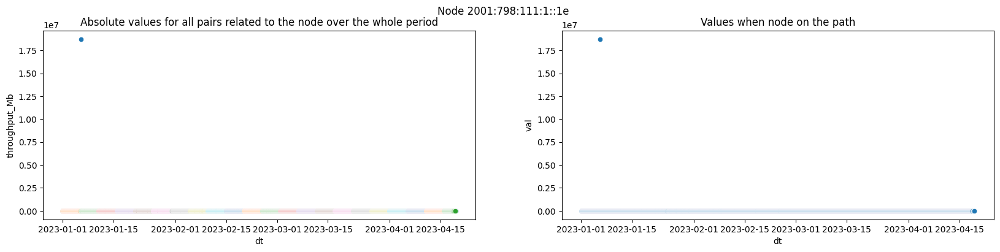

Possible issues close to IN2P3-LAPP, found on 21 links
Start: 2023-01-01 00:51:20 --- End: 2023-01-05 23:36:49  --- AVG throughput: 2406 Mbp/s
Start: 2023-01-06 02:30:18 --- End: 2023-01-10 23:44:27  --- AVG throughput: 1632 Mbp/s
Start: 2023-01-11 00:14:24 --- End: 2023-01-15 20:48:32  --- AVG throughput: 1689 Mbp/s
Start: 2023-01-16 02:47:36 --- End: 2023-01-21 00:11:51  --- AVG throughput: 1964 Mbp/s
Start: 2023-01-21 00:19:50 --- End: 2023-01-26 00:02:57  --- AVG throughput: 1816 Mbp/s
Start: 2023-01-26 00:36:38 --- End: 2023-01-30 23:59:08  --- AVG throughput: 1898 Mbp/s
Start: 2023-01-31 00:23:46 --- End: 2023-02-04 23:25:04  --- AVG throughput: 2102 Mbp/s
Start: 2023-02-05 00:25:36 --- End: 2023-02-09 23:42:10  --- AVG throughput: 2363 Mbp/s
Start: 2023-02-10 00:52:45 --- End: 2023-02-15 00:04:59  --- AVG throughput: 2332 Mbp/s
Start: 2023-02-15 02:05:29 --- End: 2023-02-19 23:55:34  --- AVG throughput: 2018 Mbp/s
Start: 2023-02-20 00:17:03 --- End: 2023-02-25 00:06:08  --- AVG 

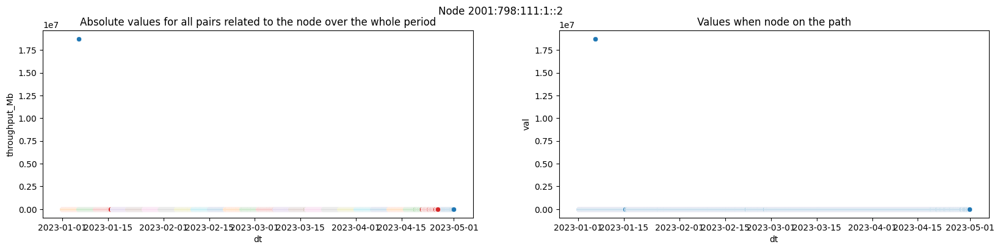

Possible issues close to PIC, found on 49 links
Start: 2023-03-11 10:54:34 --- End: 2023-03-11 20:43:39  --- AVG throughput: 569 Mbp/s


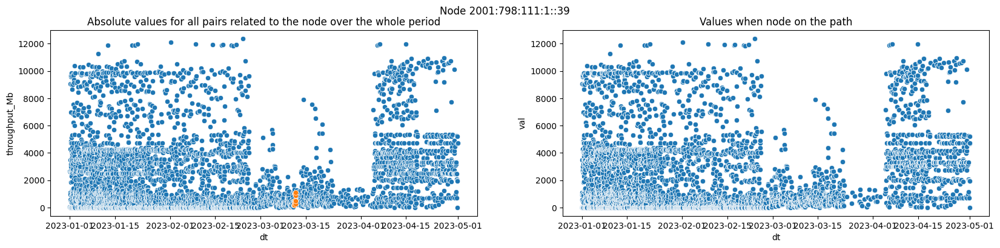

Possible issues close to FZK-LCG2, found on 17 links
Start: 2023-01-04 17:53:22 --- End: 2023-01-05 11:56:45  --- AVG throughput: 316 Mbp/s
Start: 2023-01-07 20:16:29 --- End: 2023-01-10 23:12:48  --- AVG throughput: 132 Mbp/s
Start: 2023-01-11 02:25:32 --- End: 2023-01-15 21:26:38  --- AVG throughput: 170 Mbp/s
Start: 2023-02-03 18:00:32 --- End: 2023-02-04 07:53:27  --- AVG throughput: 301 Mbp/s
Start: 2023-02-28 10:18:40 --- End: 2023-03-02 00:03:56  --- AVG throughput: 161 Mbp/s
Start: 2023-03-07 06:42:21 --- End: 2023-03-11 22:45:25  --- AVG throughput: 164 Mbp/s
Start: 2023-03-13 17:48:04 --- End: 2023-03-16 21:17:01  --- AVG throughput: 162 Mbp/s


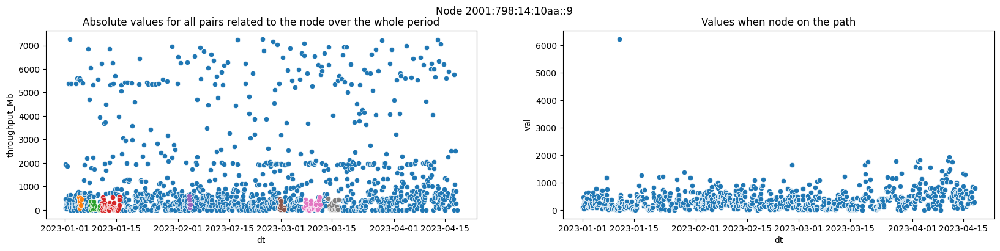

Possible issues close to BUDAPEST, found on 20 links
Start: 2023-03-07 00:13:18 --- End: 2023-03-11 17:22:04  --- AVG throughput: 65 Mbp/s


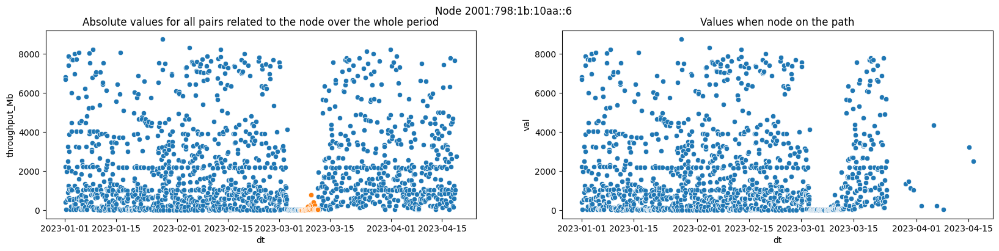

Possible issues close to BEIJING-LCG2, found on 15 links
Start: 2023-01-16 00:44:08 --- End: 2023-01-20 17:10:58  --- AVG throughput: 76 Mbp/s
Start: 2023-04-12 01:54:19 --- End: 2023-04-15 21:57:15  --- AVG throughput: 284 Mbp/s
Start: 2023-04-16 05:56:58 --- End: 2023-04-17 14:03:25  --- AVG throughput: 161 Mbp/s


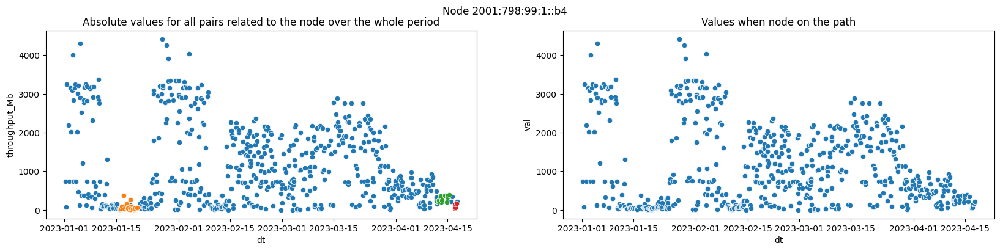

Possible issues close to BUDAPEST, found on 21 links
Start: 2023-03-07 00:13:18 --- End: 2023-03-11 17:22:04  --- AVG throughput: 65 Mbp/s


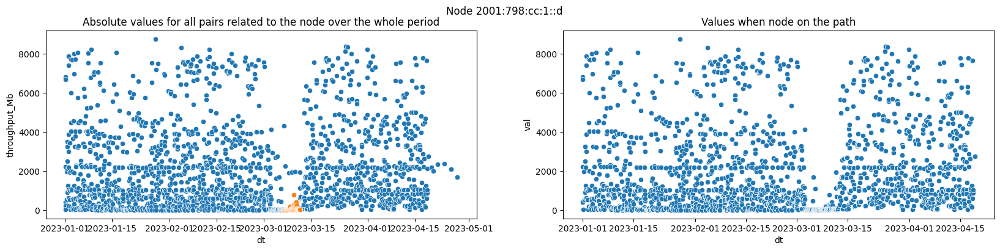

Possible issues close to TAIWAN-LCG2, found on 22 links
Start: 2023-03-12 10:28:55 --- End: 2023-03-16 23:43:23  --- AVG throughput: 2 Mbp/s


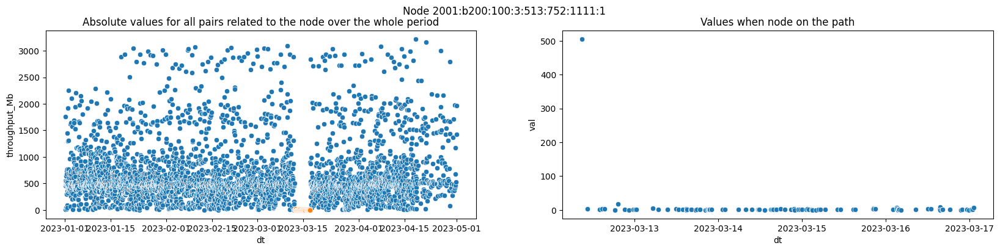

Possible issues close to TAIWAN-LCG2, found on 24 links
Start: 2023-03-15 23:58:03 --- End: 2023-03-17 00:02:38  --- AVG throughput: 0 Mbp/s


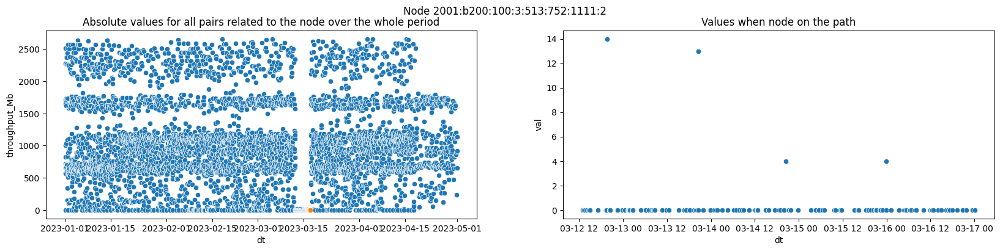

Possible issues close to TAIWAN-LCG2, found on 24 links
Start: 2023-03-12 10:28:55 --- End: 2023-03-16 23:43:23  --- AVG throughput: 2 Mbp/s


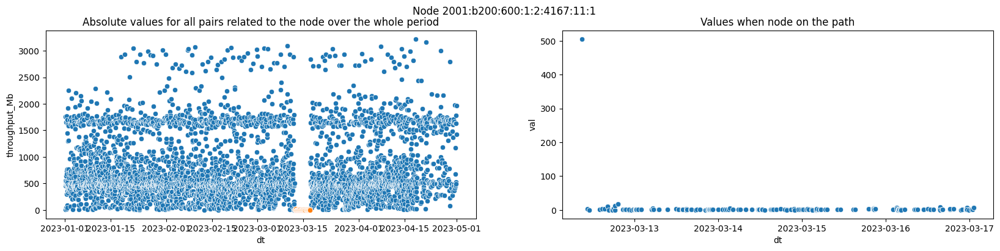

Possible issues close to TAIWAN-LCG2, found on 26 links
Start: 2023-03-15 23:58:03 --- End: 2023-03-17 00:02:38  --- AVG throughput: 0 Mbp/s


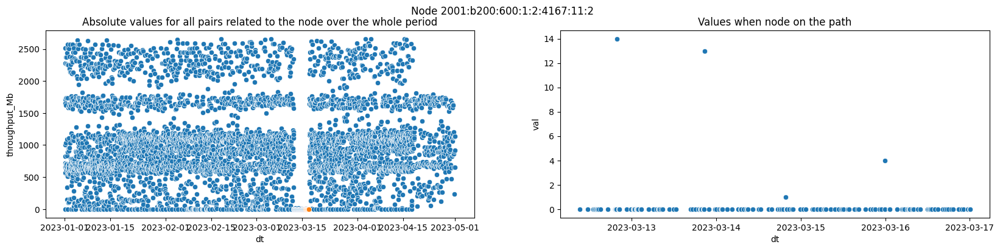

Possible issues close to BEIJING-LCG2, found on 10 links
Start: 2023-01-26 02:35:45 --- End: 2023-01-30 23:23:52  --- AVG throughput: 0 Mbp/s


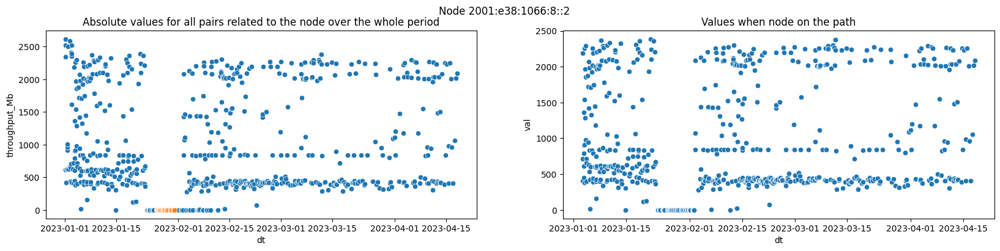

Possible issues close to TAIWAN-LCG2, found on 41 links
Start: 2023-03-12 10:28:55 --- End: 2023-03-16 23:43:23  --- AVG throughput: 2 Mbp/s


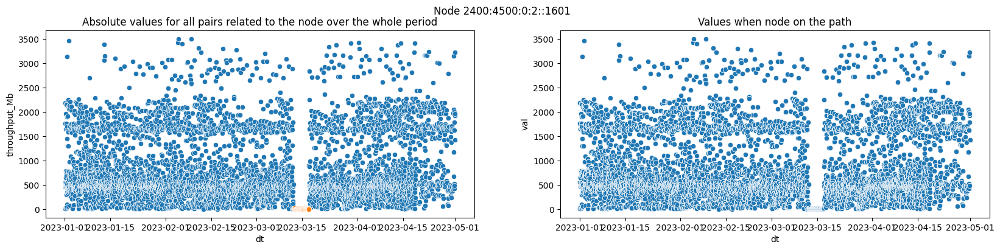

Possible issues close to TAIWAN-LCG2, found on 24 links
Start: 2023-03-12 10:28:55 --- End: 2023-03-16 23:43:23  --- AVG throughput: 2 Mbp/s


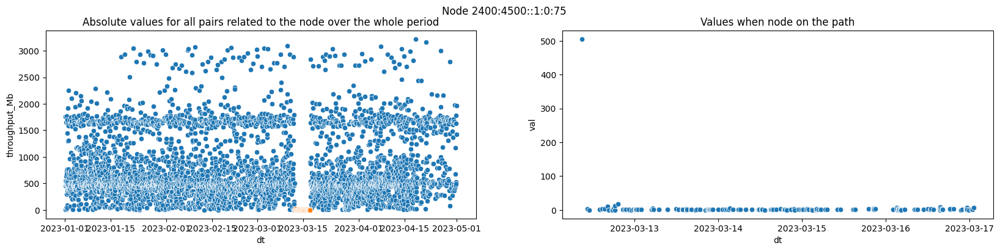

Possible issues close to TAIWAN-LCG2, found on 25 links
Start: 2023-03-15 23:58:03 --- End: 2023-03-17 00:02:38  --- AVG throughput: 0 Mbp/s


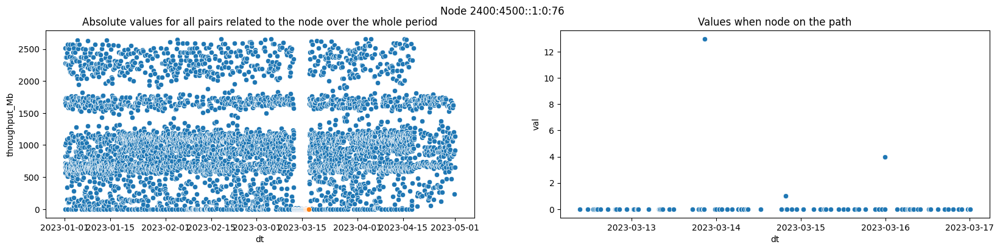

Possible issues close to VANDERBILT, found on 21 links
Start: 2023-01-21 00:38:47 --- End: 2023-01-25 23:25:31  --- AVG throughput: 19 Mbp/s
Start: 2023-01-26 00:33:54 --- End: 2023-01-30 23:25:06  --- AVG throughput: 20 Mbp/s


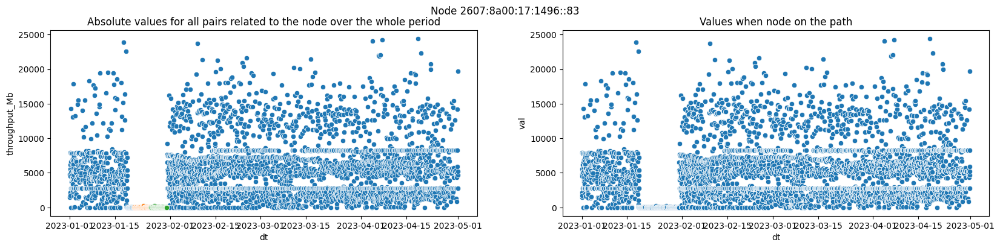

Possible issues close to USCMS-FNAL-WC1, found on 16 links
Start: 2023-02-02 18:09:17 --- End: 2023-02-04 23:50:25  --- AVG throughput: 3 Mbp/s
Start: 2023-02-05 00:24:06 --- End: 2023-02-09 23:22:11  --- AVG throughput: 2 Mbp/s
Start: 2023-02-10 00:21:36 --- End: 2023-02-10 13:43:26  --- AVG throughput: 4 Mbp/s


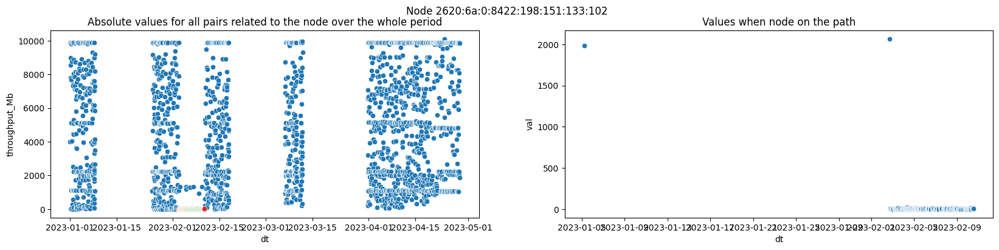

Possible issues close to INFN-T1, found on 20 links
Start: 2023-03-09 12:04:14 --- End: 2023-03-11 16:53:23  --- AVG throughput: 462 Mbp/s


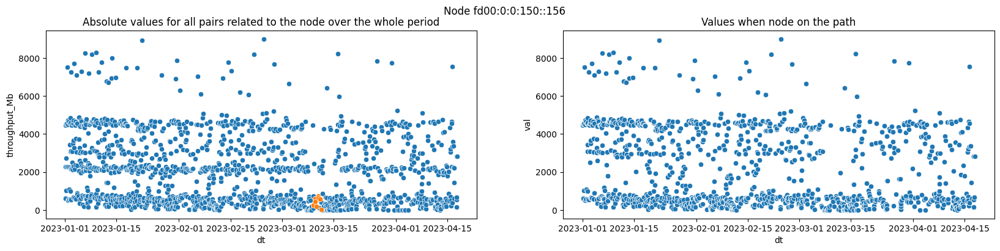

""


In [173]:
import seaborn as sns

def plotIt(group):
    node = group.name
    global node2sites
    site_pairs = set(group.site_pair.values)

    print(f'Possible issues close to {list(node2sites[node].keys())[0]}, found on {list(node2sites[node].values())[0]} links')
    
    fig, ax = plt.subplots(1, 2, figsize=(20,4), gridspec_kw={'width_ratios': [1,1]})
    fig.suptitle(f'Node {node}')
    ax[0].set_title(f'Absolute values for all pairs related to the node over the whole period')
    
    sns.scatterplot(y="throughput_Mb", x='dt', data=trptdf[trptdf['site_pair'].isin(site_pairs)], ax=ax[0])

    # give color to each small period when an issues was detected 
    for start, end, vals, curr_avg in nodeIssuesDf[nodeIssuesDf['node']==node][['tstart', 'tend', 'values_curr', 'avg_curr']].values.tolist():
        print(f"Start: {start} --- End: {end}  --- AVG throughput: {curr_avg} Mbp/s")
        
        throughput = trptdf[(trptdf['dt']>start) & (trptdf['dt']<end) \
                            & (trptdf['site_pair'].isin(site_pairs)) \
                            & (trptdf['throughput_Mb'].isin(vals))]
        
        sns.scatterplot(y="throughput_Mb", x='dt', data=throughput, ax=ax[0])

    ax[1].set_title(f'Values when node on the path')
    sns.scatterplot(y="val", x='dt', data=nodeDf[nodeDf['node']==node], ax=ax[1])
    plt.show()

nodeIssuesDf['tend'] = pd.to_datetime(nodeIssuesDf['tend'], errors='coerce')
nodeIssuesDf['tstart'] = pd.to_datetime(nodeIssuesDf['tstart'], errors='coerce')  
nodeDf = nodeDf.sort_values(['node','dt'])
nodeDf[nodeDf['node'].isin(nodeIssuesDf.node.unique())].groupby('node').apply(plotIt)

In [198]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
pd.options.display.max_columns=300

site = list(site2nodes.keys())[:1][0]
print(f"Check the correlation between the routers for site {site}")
# A high r could suggest that the problem may be present between the routers or that they are often together on the path

subset = site2nodes[site]
dict_series = {}
for node in subset:
    # for node in nodelist:
    
    for idx, row in nodeIssuesDf[nodeIssuesDf['node']==node][['tstart', 'tend', 'values']].iterrows():
        # print(row)
        start, end, vals = row['tstart'], row['tend'], row['values']
        dict_series[idx] = vals


list_series_names = [i for i in dict_series.keys()]

def get_max_correlation_from_lists(a, b):
    # This is to make sure the longest list is in the dataframe
    if len(b)>=len(a):
        a_old = a
        a = b
        b= a_old
    # Taking the body from the original code.
    df = pd.DataFrame(dict(x=a))
    CORR_VALS = np.array(b)
    def get_correlation(vals):
        return pearsonr(vals, CORR_VALS)[0]
    # Collecting the max
    return df.rolling(window=len(CORR_VALS)).apply(get_correlation).max().values[0]

# This is to create the "correlations" matrix
correlations_matrix = pd.DataFrame(index=list_series_names, columns=list_series_names )
for i in list_series_names:
    for j in list_series_names:
        correlations_matrix.loc[i,j]=get_max_correlation_from_lists(dict_series[i], dict_series[j])

correlations_matrix

Check the correlation between the routers for site UKI-SCOTGRID-GLASGOW


,0,23,77,105,137,166,222,1,24,49,78,106,138,167,196,223,248,271,290,305,318,352,373,387,400,2,26,50,80,108,139,168,197,224,249,272,291,306,319,353,374,388,401,3,27,82,110,141,170,226,4,28,52,83,111,142,171,200,227,253,274,293,308,320,355,375,389,402,5,29,84,112,143,172,228,6,30,85,113,144,173,229,25,79,107,250,251
0,1.0,0.393924,0.356876,0.330273,0.368124,0.262701,0.062477,0.207781,0.229215,0.392946,0.207884,0.138505,0.209641,0.204449,0.236252,0.168689,0.272542,0.350015,0.308007,0.29897,0.357404,0.307332,0.235722,0.322236,0.294405,0.183453,0.170111,0.423396,-0.080327,0.133827,0.230139,0.218777,0.208503,0.115735,0.253968,0.291171,0.357979,0.295557,0.323068,0.310663,0.272004,0.352235,0.280764,1.0,0.393924,0.356876,0.330273,0.368124,0.262701,0.062477,0.01739,0.147288,0.315723,0.088224,0.280689,0.377407,0.241821,-0.035797,0.089607,0.41722,0.356029,0.3634,0.281359,0.333546,0.365225,0.284525,0.315226,0.275496,0.739152,0.351606,0.333697,0.352228,0.346433,0.262701,0.062477,0.739152,0.351606,0.333697,0.352228,0.346433,0.262701,0.062477,0.452998,0.325619,0.415076,0.79853,0.613293
23,0.393924,1.0,0.230086,0.38767,0.499773,0.483616,0.371028,0.302351,0.214184,0.253527,0.373883,0.308875,0.309879,0.24136,0.305336,0.189507,0.084652,0.245725,0.258383,0.125308,0.130485,0.212658,0.059029,0.048496,0.10812,0.277199,0.206509,0.271207,0.381959,0.308533,0.319563,0.229483,0.41388,0.260935,0.140165,0.155764,0.164721,0.134099,0.155645,0.108659,-0.015828,0.13625,0.123596,0.393924,1.0,0.230086,0.38767,0.499773,0.483616,0.371028,0.34052,0.271617,0.226438,0.314778,0.257952,0.312888,0.252469,0.267587,0.336119,0.148612,0.222891,0.187821,0.104636,0.122308,0.111569,0.035887,0.147605,0.258934,0.451157,0.557065,0.152124,0.401422,0.39628,0.483616,0.371028,0.451157,0.557065,0.152124,0.401422,0.39628,0.483616,0.371028,0.572581,-0.043879,0.551341,0.561642,0.795966
77,0.356876,0.230086,1.0,0.324917,0.577613,0.409574,0.343335,0.255611,0.335486,0.368662,0.392598,0.314467,0.350114,0.472519,0.319385,0.28816,0.219237,0.048171,0.134089,0.192725,0.15569,0.204756,0.27727,0.228838,0.219393,0.306142,0.372119,0.383128,0.449577,0.31777,0.313992,0.47921,0.316737,0.281902,0.262011,0.008326,0.121023,0.199785,0.147364,0.224749,0.252952,0.184018,0.274754,0.356876,0.230086,1.0,0.324917,0.577613,0.409574,0.343335,0.326861,0.359247,0.382854,0.41008,0.374246,0.322966,0.500141,0.476194,0.266831,0.269583,0.019146,0.028831,0.205996,0.16152,0.171309,0.221193,0.310423,0.193322,0.331686,0.198483,0.658985,0.327906,0.513216,0.409574,0.343335,0.331686,0.198483,0.658985,0.327906,0.513216,0.409574,0.343335,0.610047,0.511126,0.56678,0.716594,0.6768
105,0.330273,0.38767,0.324917,1.0,0.300486,0.154448,0.180172,0.346961,0.330052,0.321226,0.328308,0.119587,0.088682,0.34648,0.341553,0.262929,0.395505,0.320613,0.376101,0.384909,0.411487,0.295527,0.277961,0.424231,0.304295,0.346961,0.330052,0.318759,0.183249,0.100044,0.080489,0.275522,0.390205,0.225423,0.312571,0.299701,0.313257,0.474891,0.371635,0.309697,0.391315,0.28312,0.369166,0.330273,0.38767,0.324917,1.0,0.300486,0.154448,0.180172,0.279889,0.291987,0.343328,0.343648,0.082445,0.050586,0.162014,0.21532,0.323639,0.341039,0.293186,0.380459,0.347109,0.345428,0.302225,0.270583,0.265041,0.365132,0.352968,0.376839,0.363608,0.782131,0.340526,0.154448,0.180172,0.352968,0.376839,0.363608,0.782131,0.340526,0.154448,0.180172,0.473662,0.273514,0.229549,0.509552,0.48897
137,0.368124,0.499773,0.577613,0.300486,1.0,0.431895,0.416274,0.546023,0.458943,0.473415,0.436366,0.303857,0.513474,0.403196,0.389646,0.399426,0.495057,0.440091,0.460174,0.432695,0.64831,0.516441,0.428098,0.414229,0.419728,0.516534,0.458943,0.579491,0.298692,0.310666,0.513474,0.403196,0.341847,0.461289,0.424395,0.479139,0.531893,0.456933,0.509306,0.510283,0.552417,0.458445,0.533189,0.368124,0.499773,0.577613,0.300486,1.0,0.431895,0.416274,0.462745,0.412549,0.430723,0.362239,0.30168,0.198616,0.403196,0.363124,0.530209,0.584037,0.419505,0.565078,0.503719,0.480043,0.46134,0.343,0.496324,0.531231,0.36731